# `l2hmc`: Example

<a href="https://arxiv.org/abs/2105.03418"><img alt="arxiv" src="http://img.shields.io/badge/arXiv-2105.03418-B31B1B.svg" align="left"></a> <a href="https://arxiv.org/abs/2112.01582"><img alt="arxiv" src="http://img.shields.io/badge/arXiv-2112.01582-B31B1B.svg" align="left" style="margin-left:10px;"></a><br>


This notebook will (attempt) to walk through the steps needed to successfully instantiate and "run" an experiment.

For this example, we wish to train the L2HMC sampler for the 2D $U(1)$ lattice gauge model with Wilson action:

$$
S_{\beta}(n) = \beta \sum_{n}\sum_{\mu<\nu}\mathrm{Re}\left[1 - U_{\mu\nu}(n) \right]
$$

This consists of the following steps:
  1. Build an `Experiment` by parsing our configuration object
  2. Train our model using the `Experiment.train()` method
  3. Evaluate our trained model `Experiment.evaluate(job_type='eval')`
  4. Compare our trained models' performance against generic HMC `Experiment.evaluate(job_type='hmc')`
  

<div class="alert alert-block alert-info" style="background:#64B5F630;color:#64B5F6;">
<b><u>Evaluating Performance</u></b>
    
Explicitly, we measure the performance of our model by comparing the _tunneling rate_ $\delta Q$ of our **trained** sampler to that of generic HMC.
    
Explicitly, the tunneling rate is given by:
    
$$
\delta Q = \frac{1}{N_{\mathrm{chains}}}\sum_{\mathrm{chains}} \left|Q_{i+1} - Q_{i}\right|
$$
    
where the difference is between subsequent states in a chain, and the sum is over all $N$ chains (each being ran in parallel, _independently_).
    
Since our goal is to generate _independent configurations_, the more our sampler tunnels between different topological sectors (_tunneling rate_), the more efficient our sampler.
    
</div>


## Imports

In [1]:
import os
print(os.environ['CUDA_VISIBLE_DEVICES'])
!getconf _NPROCESSORS_ONLN

7
256


In [2]:
os.environ['OMP_NUM_THREADS'] = '256'

In [3]:
import warnings
warnings.filterwarnings('ignore')
os.environ['TORCH_CPP_LOG_LEVEL'] = 'ERROR'

In [4]:
from __future__ import absolute_import, print_function, annotations, division

# automatically detect and reload local changes to modules
%load_ext autoreload
%autoreload 2

# unset verbose TF XLA Flags
!unset TF_XLA_FLAGS
!unset KMP_AFFINITY KMP_SETTINGS

import os

import hydra
import torch
import tensorflow as tf
import numpy as np
    
from l2hmc.main import setup, setup_tensorflow, setup_torch

_ = setup_torch(
    precision='float32',
    seed=1234,
)

_ = setup_tensorflow(
    precision='float32',
)

from hydra.core.global_hydra import GlobalHydra
from l2hmc.utils.rich import print_config
np.set_printoptions(precision=4, suppress=True)

--------------------------------------------------------------------------

  Local host:   thetagpu01
  Local device: mlx5_0
--------------------------------------------------------------------------
Using: float32 precision


In [5]:
import logging
from rich.style import Style
from rich.console import Console
from rich.logging import RichHandler
from l2hmc.utils.rich import get_console

log = logging.getLogger()
log.setLevel('INFO')

tlog = logging.getLogger('torch')
tlog.setLevel('ERROR')

wblog = logging.getLogger('wandb')
wblog.setLevel('CRITICAL')

# `ExperimentConfig`

Set some reasonable defaults for our experiments

In [6]:
#GlobalHydra.instance().clear()

defaults = [
    'steps.nera=5',
    'steps.nepoch=100',
    'steps.print=50',
    'steps.test=2000',
]

defaults_u1 = [
    *defaults,
    'network.use_batch_norm=false',
    'annealing_schedule.beta_init=4.0',
    'annealing_schedule.beta_final=5.0',
]

defaults_su3 = [
    *defaults,
    'dynamics=su3',
    'dynamics.nchains=5',
    'steps.nera=0',
    'steps.nepoch=0',
    'dynamics.latvolume=[8, 8, 8, 16]',
    'annealing_schedule.beta_init=0.7796',
    'annealing_schedule.beta_final=0.7796',
]

In [7]:
outputs = {
    'pytorch': {
        'train': {},
        'eval': {},
        'hmc': {},
    },
    'tensorflow': {
        'train': {},
        'eval': {},
        'hmc': {},
    },
}

# Initialize and Build `Experiment` objects:

- The `l2hmc.configs` module provides a function `get_experiment`:

```python
def get_experiment(overrides: list[str]) -> Experiment:
    ...
```

which will:

1. Load the default options from `conf/config.yaml`
2. Override the default options with any values provided in `overrides`
3. Parse these options and build an `ExperimentConfig` which uniquely defines an experiment
3. Instantiate / return an `Experiment` from the `ExperimentConfig`

```python
>>> train_output = experiment.train()
>>> eval_output = experiment.evaluate(job_type='eval')
>>> hmc_output = experiment.evaluate(job_type='hmc')
```

<div class="alert alert-block alert-info" style="background:#64B5F630;color:#64B5F6;">
<b><u>Overriding Defaults</u></b>

Specifics about the training / evaluation / hmc runs can be flexibly overridden by passing arguments to the training / evaluation / hmc runs, respectively
</div>

In [8]:
import gc
gc.collect()
with torch.no_grad():
    torch.cuda.empty_cache()

In [9]:
from l2hmc.configs import get_experiment

ptExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=pytorch',
        'init_wandb=false',
        'init_aim=false',
    ]
)

13:28:37 INFO     Using horovod for distributed training                                                   ]8;id=462141;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=7855;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#112\112]8;;\

13:28:43 DEBUG    Built networks.                                                                        ]8;id=955227;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py\dynamics.py]8;;\:]8;id=984894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py#147\147]8;;\

         DEBUG    dynamics._networks_built: True                                                         ]8;id=846203;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py\dynamics.py]8;;\:]8;id=36622;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py#157\157]8;;\

         INFO     Looking for checkpoints in:                                                             ]8;id=726754;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=103202;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#327\327]8;;\
                   /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/che               
                  ckpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-16-32_4-4-4-4_2-2-2-2               
                  /16-16-16-16_dp-0.0_bn-False/pytorch                                                                  

         INFO     Loading model from: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hm ]8;id=803713;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=248313;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#348\348]8;;\
                  c-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-16               
                  -32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/model.pth                                     

13:28:47 INFO     Loading checkpoint from: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects ]8;id=18274;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=827088;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#352\352]8;;\
                  /l2hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4               
                  -8-16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-9-0-2022-11-06-123805               
                  .tar                                                                                                  

13:28:54 WARNING  Using `torch.optim.Adam` optimizer                                                      ]8;id=16609;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=679808;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#142\142]8;;\

         INFO     Using horovod for distributed training                                                   ]8;id=653557;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=507768;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#112\112]8;;\

In [10]:
tfExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=tensorflow',
        'backend=horovod',
        'init_wandb=false',
        'init_aim=false',
    ]
)

13:28:57 DEBUG    Setting JobRuntime:name=app                                                               ]8;id=486065;file:///home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/hydra/core/utils.py\utils.py]8;;\:]8;id=95721;file:///home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/hydra/core/utils.py#279\279]8;;\

## PyTorch

─────────────────────────────────────────────── ERA: 0 / 5, BETA: 4.000 ────────────────────────────────────────────────

13:29:29 INFO     era=0   epoch=0   tstep=0   dt=2.9054 beta=4.0000 loss=-614.6200 dQsin=1.9623           ]8;id=191984;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=119970;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#981\981]8;;\
                  dQint=4.5845 energy=1285.1685 logprob=1281.9906 logdet=3.1779 sldf=7.2063 sldb=-7.2153                
                  sld=3.1779 xeps=0.2383 veps=0.1792 acc=0.9848 sumlogdet=-0.0199 acc_mask=0.9849                       
                  plaqs=0.0006 intQ=0.1172 sinQ=0.0273 lr=0.0010                                                        

13:34:10 INFO     era=0   epoch=50  tstep=50  dt=1.4013 beta=4.0000 loss=-24.5864 dQsin=0.2516            ]8;id=886412;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=15328;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#981\981]8;;\
                  dQint=0.2451 energy=409.3733 logprob=406.4539 logdet=2.9194 sldf=6.6683 sldb=-6.6673                  
                  sld=2.9194 xeps=0.2379 veps=0.1794 acc=0.3598 sumlogdet=-0.0047 acc_mask=0.3662                       
                  plaqs=0.8619 intQ=-0.0015 sinQ=-0.0048 lr=0.0010                                                      

13:38:30 INFO     Saving checkpoint to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=527521;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=923240;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#287\287]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-               
                  16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-0-0-2022-11-06-133830.ta               
                  r                                                                                                     

13:38:31 INFO     Saving took: 1.30805s                                                                  ]8;id=261963;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=699668;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1143\1143]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=567372;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=488530;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1144\1144]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch                                            

         INFO     Era 0 took: 566.537s                                                                   ]8;id=71900;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=707921;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1145\1145]8;;\

─────────────────────────────────────────────── ERA: 1 / 5, BETA: 4.250 ────────────────────────────────────────────────

13:38:54 INFO     era=1   epoch=0   tstep=100 dt=1.4221 beta=4.2500 loss=-27.6742 dQsin=0.2689            ]8;id=93248;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=540063;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#981\981]8;;\
                  dQint=0.2627 energy=417.7211 logprob=414.6298 logdet=3.0912 sldf=7.0966 sldb=-7.0986                  
                  sld=3.0912 xeps=0.2384 veps=0.1799 acc=0.4393 sumlogdet=0.0023 acc_mask=0.4233                        
                  plaqs=0.8636 intQ=0.0088 sinQ=0.0018 lr=0.0010                                                        

13:43:34 INFO     era=1   epoch=50  tstep=150 dt=1.3945 beta=4.2500 loss=-16.4725 dQsin=0.2144            ]8;id=607128;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=48198;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#981\981]8;;\
                  dQint=0.2075 energy=409.5258 logprob=405.8853 logdet=3.6404 sldf=8.2232 sldb=-8.1864                  
                  sld=3.6404 xeps=0.2401 veps=0.1777 acc=0.3906 sumlogdet=0.0067 acc_mask=0.3882                        
                  plaqs=0.8725 intQ=0.0239 sinQ=0.0201 lr=0.0010                                                        

13:46:35 INFO     Saving checkpoint to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=282680;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=864426;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#287\287]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-               
                  16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-1-0-2022-11-06-134635.ta               
                  r                                                                                                     

13:46:36 INFO     Saving took: 1.33785s                                                                  ]8;id=583461;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=66141;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1143\1143]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=675947;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=317119;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1144\1144]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch                                            

         INFO     Era 1 took: 484.607s                                                                   ]8;id=504403;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=891476;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1145\1145]8;;\

         INFO     Avgs over last era:                                                                    ]8;id=372495;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=261254;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1112\1112]8;;\
                   tstep=147.5000, dt=1.1166, beta=4.2500, loss=-18.2633, dQsin=0.2316, dQint=0.2186,                   
                  energy=409.9913, logprob=406.6148, logdet=3.3764, sldf=7.7447, sldb=-7.7291,                          
                  sld=3.3764, xeps=0.2398, veps=0.1784, acc=0.4007, sumlogdet=0.0069, acc_mask=0.4046,                  
                  plaqs=0.8716, intQ=0.0119, sinQ=0.0094, lr=0.0010                                                     
                                                                                                                        

─────────────────────────────────────────────── ERA: 2 / 5, BETA: 4.500 ────────────────────────────────────────────────

13:46:52 INFO     era=2   epoch=0   tstep=200 dt=0.6892 beta=4.5000 loss=-17.4087 dQsin=0.2274            ]8;id=687322;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=978861;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#981\981]8;;\
                  dQint=0.2124 energy=417.9979 logprob=414.4763 logdet=3.5216 sldf=8.2474 sldb=-8.2038                  
                  sld=3.5216 xeps=0.2411 veps=0.1773 acc=0.4124 sumlogdet=0.0080 acc_mask=0.4067                        
                  plaqs=0.8723 intQ=0.0034 sinQ=0.0014 lr=0.0010                                                        

13:50:02 INFO     era=2   epoch=50  tstep=250 dt=0.7096 beta=4.5000 loss=-10.2938 dQsin=0.1999            ]8;id=209748;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=475411;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#981\981]8;;\
                  dQint=0.1748 energy=409.3233 logprob=406.1412 logdet=3.1821 sldf=7.6593 sldb=-7.6412                  
                  sld=3.1821 xeps=0.2405 veps=0.1779 acc=0.4096 sumlogdet=0.0020 acc_mask=0.4102                        
                  plaqs=0.8799 intQ=0.0557 sinQ=0.0434 lr=0.0010                                                        

13:52:56 INFO     Saving checkpoint to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=919134;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=555914;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#287\287]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-               
                  16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-2-0-2022-11-06-135256.ta               
                  r                                                                                                     

13:52:57 INFO     Saving took: 1.33735s                                                                  ]8;id=697734;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=20237;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1143\1143]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=987208;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=532783;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1144\1144]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch                                            

         INFO     Era 2 took: 381.201s                                                                   ]8;id=74017;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=6061;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1145\1145]8;;\

         INFO     Avgs over last era:                                                                    ]8;id=349710;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=150752;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1112\1112]8;;\
                   tstep=247.5000, dt=0.6973, beta=4.5000, loss=-11.0546, dQsin=0.1986, dQint=0.1730,                   
                  energy=409.6254, logprob=406.3307, logdet=3.2948, sldf=7.9508, sldb=-7.9299,                          
                  sld=3.2948, xeps=0.2401, veps=0.1785, acc=0.4162, sumlogdet=0.0100, acc_mask=0.4185,                  
                  plaqs=0.8794, intQ=0.0272, sinQ=0.0219, lr=0.0010                                                     
                                                                                                                        

─────────────────────────────────────────────── ERA: 3 / 5, BETA: 4.750 ────────────────────────────────────────────────

13:53:14 INFO     era=3   epoch=0   tstep=300 dt=0.6884 beta=4.7500 loss=-5.8715 dQsin=0.1709             ]8;id=744502;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=495794;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#981\981]8;;\
                  dQint=0.1411 energy=415.7298 logprob=412.6924 logdet=3.0374 sldf=7.6455 sldb=-7.6338                  
                  sld=3.0374 xeps=0.2388 veps=0.1807 acc=0.4232 sumlogdet=-0.0049 acc_mask=0.4106                       
                  plaqs=0.8801 intQ=0.0210 sinQ=0.0175 lr=0.0010                                                        

13:56:23 INFO     era=3   epoch=50  tstep=350 dt=0.6965 beta=4.7500 loss=-4.8673 dQsin=0.1680             ]8;id=689286;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=395677;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#981\981]8;;\
                  dQint=0.1367 energy=407.8259 logprob=404.7866 logdet=3.0393 sldf=7.4611 sldb=-7.4539                  
                  sld=3.0393 xeps=0.2385 veps=0.1800 acc=0.4158 sumlogdet=0.0060 acc_mask=0.4175                        
                  plaqs=0.8873 intQ=0.0137 sinQ=0.0131 lr=0.0010                                                        

13:59:17 INFO     Saving checkpoint to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=175230;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=56806;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#287\287]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-               
                  16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-3-0-2022-11-06-135917.ta               
                  r                                                                                                     

13:59:18 INFO     Saving took: 1.35855s                                                                  ]8;id=79937;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=616068;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1143\1143]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=520703;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=171969;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1144\1144]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch                                            

         INFO     Era 3 took: 380.732s                                                                   ]8;id=78980;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=584403;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1145\1145]8;;\

         INFO     Avgs over last era:                                                                    ]8;id=225542;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=151252;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1112\1112]8;;\
                   tstep=347.5000, dt=0.7027, beta=4.7500, loss=-3.4307, dQsin=0.1592, dQint=0.1262,                    
                  energy=408.8583, logprob=405.7545, logdet=3.1038, sldf=7.6297, sldb=-7.6146,                          
                  sld=3.1038, xeps=0.2388, veps=0.1797, acc=0.4201, sumlogdet=0.0073, acc_mask=0.4196,                  
                  plaqs=0.8864, intQ=0.0077, sinQ=0.0060, lr=0.0010                                                     
                                                                                                                        

─────────────────────────────────────────────── ERA: 4 / 5, BETA: 5.000 ────────────────────────────────────────────────

13:59:35 INFO     era=4   epoch=0   tstep=400 dt=0.6903 beta=5.0000 loss=-0.1756 dQsin=0.1458             ]8;id=28446;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=982837;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#981\981]8;;\
                  dQint=0.1104 energy=416.1502 logprob=413.0395 logdet=3.1107 sldf=7.6694 sldb=-7.6676                  
                  sld=3.1107 xeps=0.2389 veps=0.1784 acc=0.4095 sumlogdet=0.0030 acc_mask=0.4131                        
                  plaqs=0.8871 intQ=0.0215 sinQ=0.0162 lr=0.0010                                                        

14:02:41 INFO     era=4   epoch=50  tstep=450 dt=0.6955 beta=5.0000 loss=4.7271 dQsin=0.1180 dQint=0.0850 ]8;id=363049;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=808431;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#981\981]8;;\
                  energy=408.3129 logprob=405.3638 logdet=2.9491 sldf=7.2452 sldb=-7.2531 sld=2.9491                    
                  xeps=0.2383 veps=0.1774 acc=0.3978 sumlogdet=-0.0021 acc_mask=0.3901 plaqs=0.8930                     
                  intQ=0.0171 sinQ=0.0132 lr=0.0010                                                                     

14:05:35 INFO     Saving checkpoint to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=116275;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=555413;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#287\287]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-               
                  16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-4-0-2022-11-06-140535.ta               
                  r                                                                                                     

14:05:36 INFO     Saving took: 1.31426s                                                                  ]8;id=148088;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=703072;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1143\1143]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=320227;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=476202;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1144\1144]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch                                            

         INFO     Era 4 took: 378.465s                                                                   ]8;id=41512;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=436470;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1145\1145]8;;\

14:06:28 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=694562;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=42157;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/train/plots/ridgepl                    
                  ots/energy_ridgeplot.svg                                                                              

14:07:19 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=185957;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=284867;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/train/plots/ridgepl                    
                  ots/logprob_ridgeplot.svg                                                                             

14:08:08 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=162078;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=314858;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/train/plots/ridgepl                    
                  ots/logdet_ridgeplot.svg                                                                              

14:08:57 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=888762;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=162058;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/train/plots/ridgepl                    
                  ots/sldf_ridgeplot.svg                                                                                

14:09:46 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=817019;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=874396;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/train/plots/ridgepl                    
                  ots/sldb_ridgeplot.svg                                                                                

14:10:35 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=487065;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=43057;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/train/plots/ridgepl                    
                  ots/sld_ridgeplot.svg                                                                                 

14:10:54 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=590459;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=801383;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/train/data/train_data.h5                    

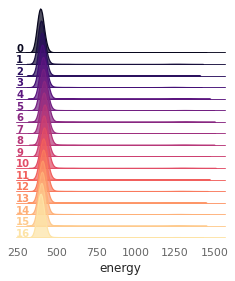

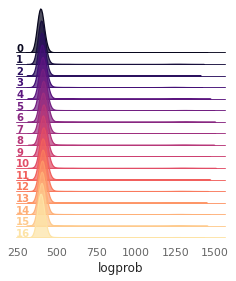

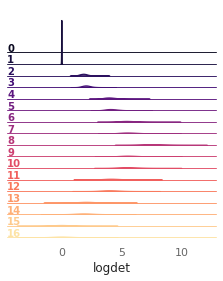

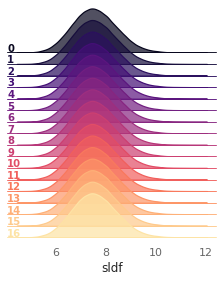

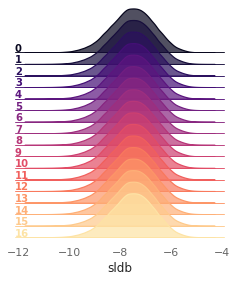

...

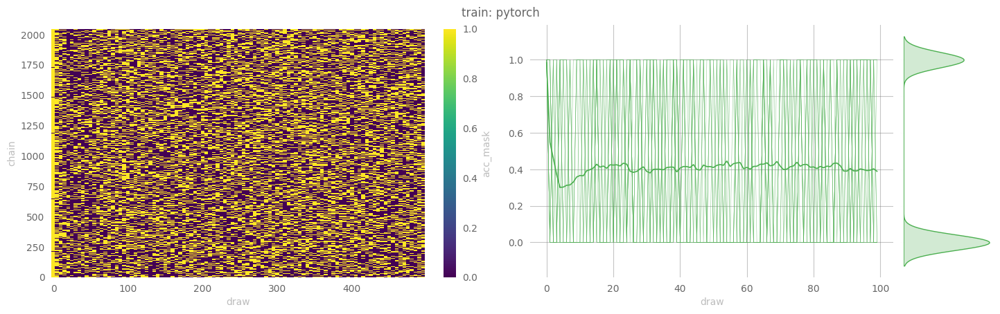

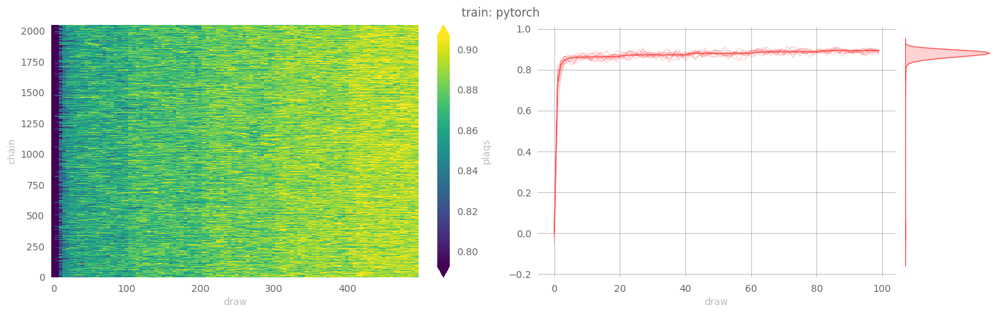

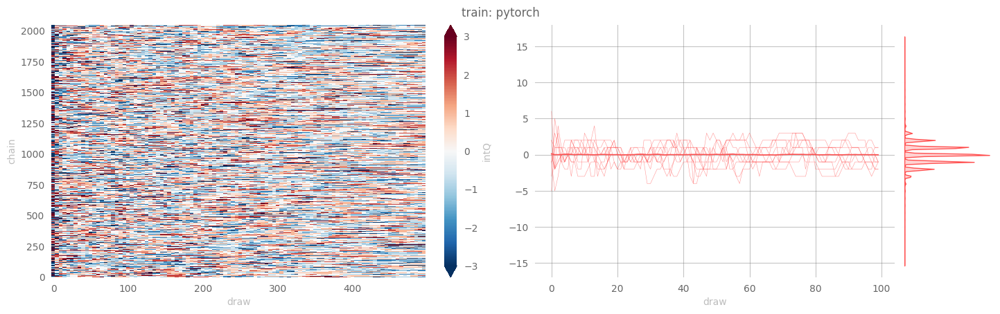

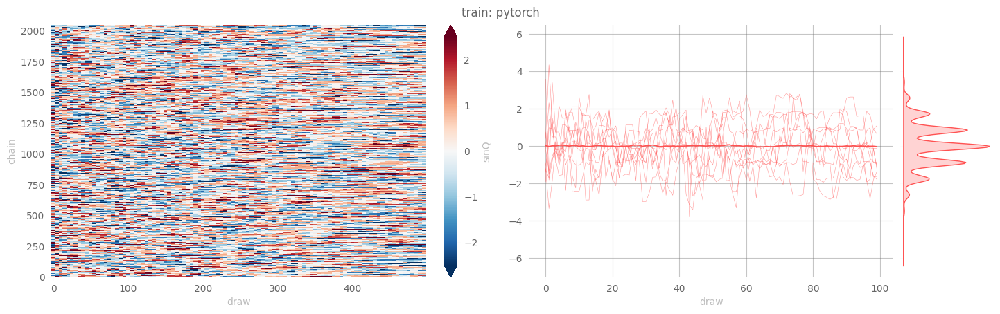

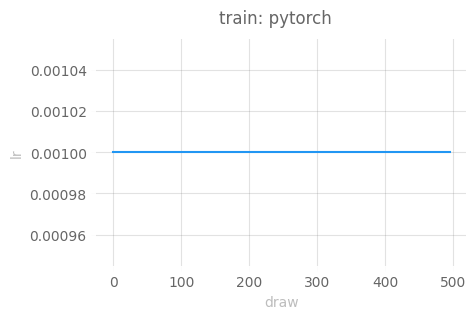

In [11]:
import warnings
import seaborn as sns

warnings.filterwarnings('ignore')
with sns.plotting_context("talk"):
    outputs['pytorch']['train'] = ptExpU1.train()

14:13:17 WARNING  x.shape (original): torch.Size([2048, 2, 16, 16])                                       ]8;id=366574;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=358306;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#190\190]8;;\

         WARNING  x[:nchains].shape: torch.Size([128, 2, 16, 16])                                         ]8;id=611173;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=856123;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#190\190]8;;\

         INFO     eps=None                                                                                ]8;id=490858;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=47531;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#679\679]8;;\
                  beta=5.0                                                                                              
                  nlog=10                                                                                               
                  table=<rich.table.Table object at 0x7fa22407d220>                                                     
                  nprint=100                                                                                            
                  eval_steps=1000                                                                                       
                  nleapfrog=None                                                                                        

  0%|          | 0/1000 [00:00<?, ?it/s]

14:13:33 INFO     estep=100 dt=0.1377 beta=5.0000 loss=1.5288 dQsin=0.1272 dQint=0.1016 energy=406.4977   ]8;id=820919;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=493711;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=402.8917 logdet=3.6060 sldf=8.2365 sldb=-8.1270 sld=3.6060 xeps=0.2396                        
                  veps=0.1736 acc=0.3236 sumlogdet=0.0029 acc_mask=0.3125 plaqs=0.8932 intQ=-0.0234                     
                  sinQ=-0.0143                                                                                          

14:13:48 INFO     estep=200 dt=0.1392 beta=5.0000 loss=1.1133 dQsin=0.1194 dQint=0.0781 energy=409.6335   ]8;id=912458;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=857047;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=406.0906 logdet=3.5429 sldf=8.1632 sldb=-8.1582 sld=3.5429 xeps=0.2396                        
                  veps=0.1736 acc=0.3557 sumlogdet=-0.0725 acc_mask=0.3359 plaqs=0.8924 intQ=0.2031                     
                  sinQ=0.1761                                                                                           

14:14:03 INFO     estep=300 dt=0.1402 beta=5.0000 loss=14.7252 dQsin=0.0733 dQint=0.0313 energy=407.3969  ]8;id=623814;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=924390;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=403.8487 logdet=3.5482 sldf=8.2071 sldb=-8.2000 sld=3.5482 xeps=0.2396                        
                  veps=0.1736 acc=0.3487 sumlogdet=-0.0140 acc_mask=0.3203 plaqs=0.8945 intQ=-0.1406                    
                  sinQ=-0.1378                                                                                          

14:14:18 INFO     estep=400 dt=0.1410 beta=5.0000 loss=5.7411 dQsin=0.1166 dQint=0.0859 energy=406.8525   ]8;id=178227;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=460950;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=403.2709 logdet=3.5817 sldf=8.2009 sldb=-8.1443 sld=3.5817 xeps=0.2396                        
                  veps=0.1736 acc=0.3955 sumlogdet=0.0388 acc_mask=0.3828 plaqs=0.8944 intQ=-0.1719                     
                  sinQ=-0.1620                                                                                          

14:14:33 INFO     estep=500 dt=0.1417 beta=5.0000 loss=-2.4169 dQsin=0.1593 dQint=0.1094 energy=408.2356  ]8;id=769178;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=819004;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=404.7198 logdet=3.5159 sldf=8.1782 sldb=-8.2289 sld=3.5159 xeps=0.2396                        
                  veps=0.1736 acc=0.4531 sumlogdet=-0.0496 acc_mask=0.5078 plaqs=0.8928 intQ=-0.1406                    
                  sinQ=-0.1291                                                                                          

14:14:48 INFO     estep=600 dt=0.2776 beta=5.0000 loss=5.9363 dQsin=0.0753 dQint=0.0469 energy=411.3233   ]8;id=544433;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=854318;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=407.7893 logdet=3.5339 sldf=8.2170 sldb=-8.2777 sld=3.5339 xeps=0.2396                        
                  veps=0.1736 acc=0.3977 sumlogdet=-0.0244 acc_mask=0.3516 plaqs=0.8920 intQ=0.0156                     
                  sinQ=0.0135                                                                                           

14:15:02 INFO     estep=700 dt=0.1472 beta=5.0000 loss=8.9063 dQsin=0.0947 dQint=0.0547 energy=414.0303   ]8;id=459142;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=310041;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=410.4617 logdet=3.5685 sldf=8.2462 sldb=-8.1753 sld=3.5685 xeps=0.2396                        
                  veps=0.1736 acc=0.3177 sumlogdet=0.0396 acc_mask=0.3203 plaqs=0.8927 intQ=0.0078                      
                  sinQ=-0.0007                                                                                          

14:15:17 INFO     estep=800 dt=0.1417 beta=5.0000 loss=-2.6372 dQsin=0.1834 dQint=0.1641 energy=412.1464  ]8;id=288401;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=129894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=408.5980 logdet=3.5484 sldf=8.1322 sldb=-8.0720 sld=3.5484 xeps=0.2396                        
                  veps=0.1736 acc=0.3915 sumlogdet=0.0145 acc_mask=0.3750 plaqs=0.8931 intQ=0.0234                      
                  sinQ=0.0275                                                                                           

14:15:32 INFO     estep=900 dt=0.1421 beta=5.0000 loss=4.0528 dQsin=0.1324 dQint=0.1016 energy=412.4844   ]8;id=815444;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=194638;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=408.9455 logdet=3.5389 sldf=8.1079 sldb=-8.1042 sld=3.5389 xeps=0.2396                        
                  veps=0.1736 acc=0.3888 sumlogdet=0.0021 acc_mask=0.3672 plaqs=0.8929 intQ=0.0703                      
                  sinQ=0.0691                                                                                           

14:15:51 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=436548;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=457241;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/eval/plots/ridgeplo                    
                  ts/energy_ridgeplot.svg                                                                               

14:15:56 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=806420;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=125270;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/eval/plots/ridgeplo                    
                  ts/logprob_ridgeplot.svg                                                                              

14:16:01 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=984713;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=555534;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/eval/plots/ridgeplo                    
                  ts/logdet_ridgeplot.svg                                                                               

14:16:06 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=108100;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=869711;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/eval/plots/ridgeplo                    
                  ts/sldf_ridgeplot.svg                                                                                 

14:16:11 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=881401;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=508770;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/eval/plots/ridgeplo                    
                  ts/sldb_ridgeplot.svg                                                                                 

14:16:16 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=395124;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=857456;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/eval/plots/ridgeplo                    
                  ts/sld_ridgeplot.svg                                                                                  

14:16:27 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=856439;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=688276;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/eval/data/eval_data.h5                      

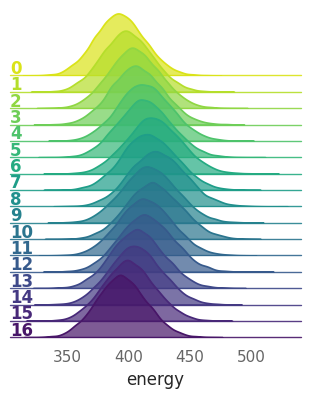

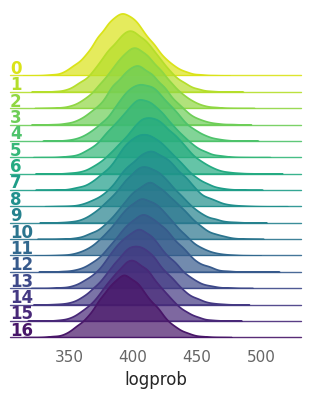

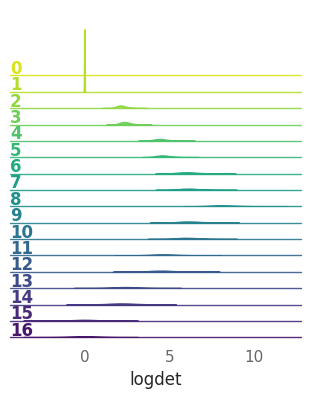

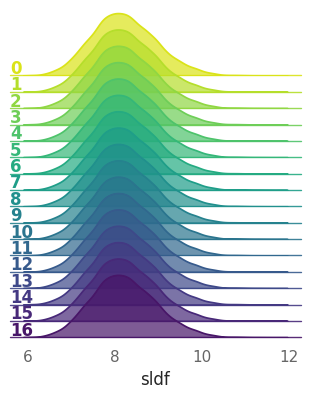

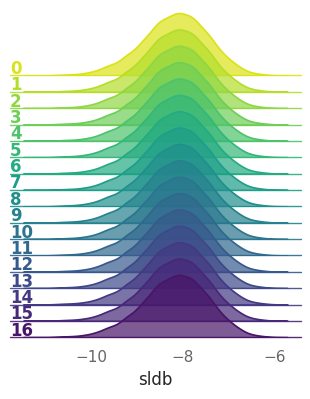

...

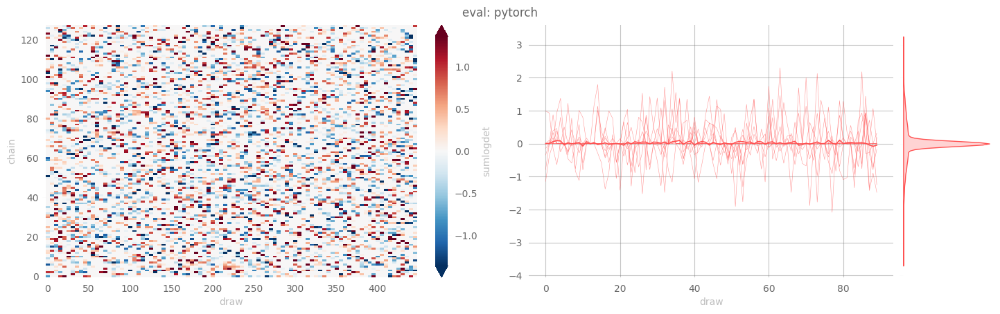

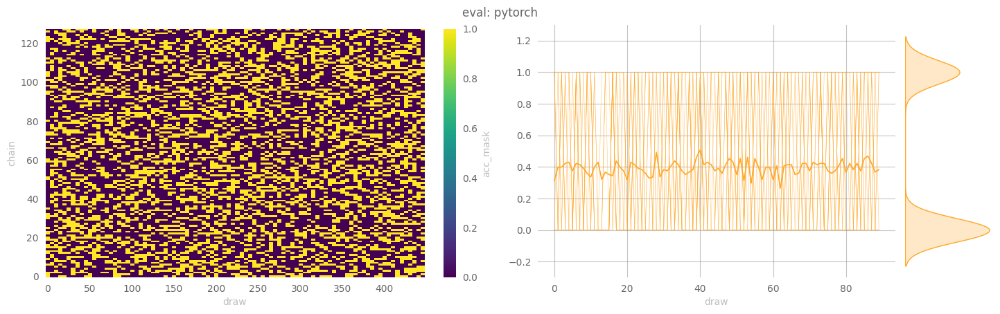

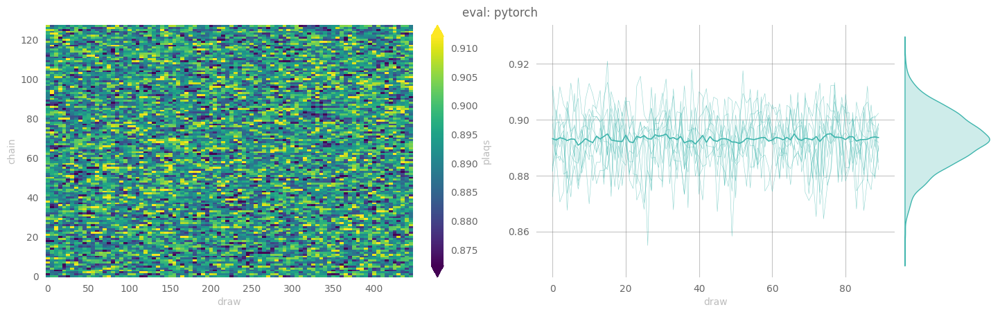

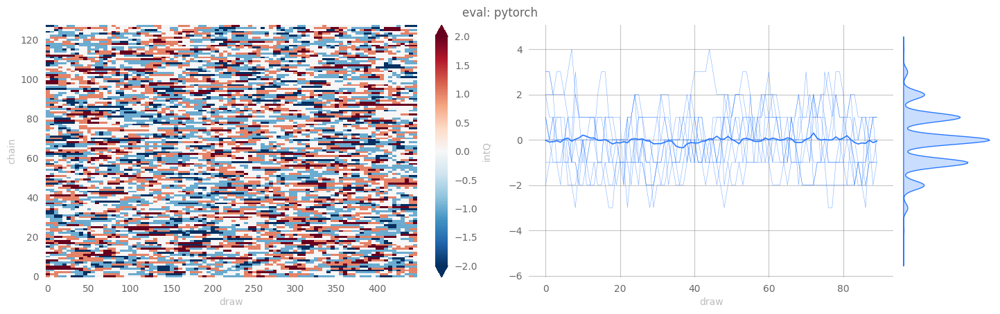

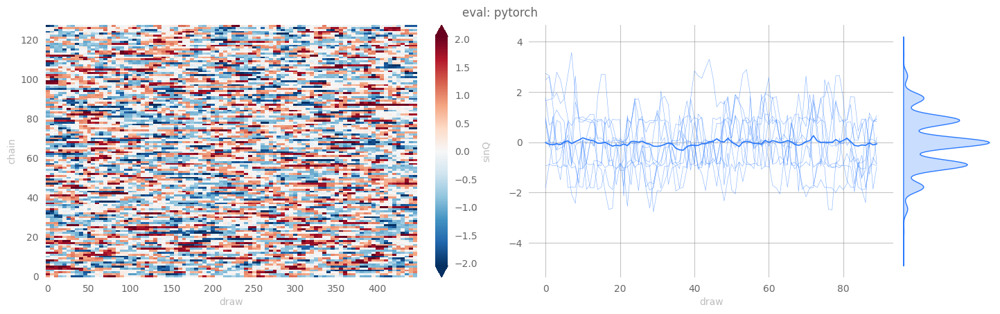

In [12]:
outputs['pytorch']['eval'] = ptExpU1.evaluate(
    job_type='eval',
    nchains=128,
    eval_steps=1000,
    nprint=100,
)

14:17:42 WARNING  Using step size eps: 0.1250 for generic HMC                                             ]8;id=267884;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=200711;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#632\632]8;;\

         WARNING  x.shape (original): torch.Size([2048, 2, 16, 16])                                       ]8;id=362124;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=113411;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#190\190]8;;\

         WARNING  x[:nchains].shape: torch.Size([128, 2, 16, 16])                                         ]8;id=736791;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=734143;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#190\190]8;;\

         INFO     eps=0.125                                                                               ]8;id=849284;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=164804;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#679\679]8;;\
                  beta=5.0                                                                                              
                  nlog=10                                                                                               
                  table=<rich.table.Table object at 0x7f90900ad790>                                                     
                  nprint=100                                                                                            
                  eval_steps=1000                                                                                       
                  nleapfrog=16                                                                                          

  0%|          | 0/1000 [00:00<?, ?it/s]

14:17:45 INFO     hstep=100 dt=0.0283 beta=5.0000 loss=6.5139 dQsin=0.1051 dQint=0.0156 energy=396.8875   ]8;id=608608;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=952097;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=396.8875 logdet=0.0000 acc=0.6178 sumlogdet=0.0000 acc_mask=0.6406 plaqs=0.8914               
                  intQ=0.1719 sinQ=0.1386                                                                               

14:17:49 INFO     hstep=200 dt=0.0284 beta=5.0000 loss=4.3957 dQsin=0.1122 dQint=0.0156 energy=393.7154   ]8;id=988809;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=282413;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=393.7154 logdet=0.0000 acc=0.6023 sumlogdet=0.0000 acc_mask=0.6094 plaqs=0.8921               
                  intQ=0.1797 sinQ=0.1542                                                                               

14:17:52 INFO     hstep=300 dt=0.0283 beta=5.0000 loss=3.9924 dQsin=0.1202 dQint=0.0234 energy=393.6230   ]8;id=162368;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=889115;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=393.6230 logdet=0.0000 acc=0.6722 sumlogdet=0.0000 acc_mask=0.6484 plaqs=0.8924               
                  intQ=-0.1172 sinQ=-0.0783                                                                             

14:17:55 INFO     hstep=400 dt=0.0283 beta=5.0000 loss=5.2151 dQsin=0.1131 dQint=0.0313 energy=394.0275   ]8;id=881306;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=755108;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=394.0275 logdet=0.0000 acc=0.6288 sumlogdet=0.0000 acc_mask=0.6250 plaqs=0.8936               
                  intQ=-0.0156 sinQ=-0.0036                                                                             

14:17:58 INFO     hstep=500 dt=0.0264 beta=5.0000 loss=5.7676 dQsin=0.0835 dQint=0.0156 energy=395.2712   ]8;id=339203;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=832110;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=395.2712 logdet=0.0000 acc=0.5173 sumlogdet=0.0000 acc_mask=0.5000 plaqs=0.8939               
                  intQ=-0.0937 sinQ=-0.0810                                                                             

14:18:01 INFO     hstep=600 dt=0.0264 beta=5.0000 loss=9.3410 dQsin=0.0993 dQint=0.0156 energy=392.3118   ]8;id=825218;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=468368;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=392.3118 logdet=0.0000 acc=0.6390 sumlogdet=0.0000 acc_mask=0.6562 plaqs=0.8927               
                  intQ=0.1172 sinQ=0.0901                                                                               

14:18:03 INFO     hstep=700 dt=0.0268 beta=5.0000 loss=6.2393 dQsin=0.1085 dQint=0.0156 energy=391.5356   ]8;id=755692;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=74211;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=391.5356 logdet=0.0000 acc=0.6542 sumlogdet=0.0000 acc_mask=0.6406 plaqs=0.8936               
                  intQ=0.1094 sinQ=0.0839                                                                               

14:18:06 INFO     hstep=800 dt=0.0271 beta=5.0000 loss=8.4002 dQsin=0.1004 dQint=0.0313 energy=389.9739   ]8;id=82304;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=414442;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=389.9739 logdet=0.0000 acc=0.6429 sumlogdet=0.0000 acc_mask=0.6406 plaqs=0.8929               
                  intQ=0.0391 sinQ=0.0309                                                                               

14:18:09 INFO     hstep=900 dt=0.0272 beta=5.0000 loss=7.9392 dQsin=0.1064 dQint=0.0078 energy=391.5505   ]8;id=224552;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=50054;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#797\797]8;;\
                  logprob=391.5505 logdet=0.0000 acc=0.6411 sumlogdet=0.0000 acc_mask=0.6328 plaqs=0.8940               
                  intQ=-0.1094 sinQ=-0.0782                                                                             

14:18:16 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=937984;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=300032;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/hmc/plots/ridgeplot                    
                  s/energy_ridgeplot.svg                                                                                

14:18:21 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=842428;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=39840;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/hmc/plots/ridgeplot                    
                  s/logprob_ridgeplot.svg                                                                               

14:18:25 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=230048;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=531329;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/hmc/plots/ridgeplot                    
                  s/logdet_ridgeplot.svg                                                                                

14:18:35 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=869921;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=91926;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-06-132837/pytorch/hmc/data/hmc_data.h5                        

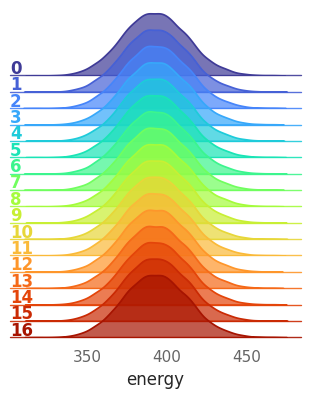

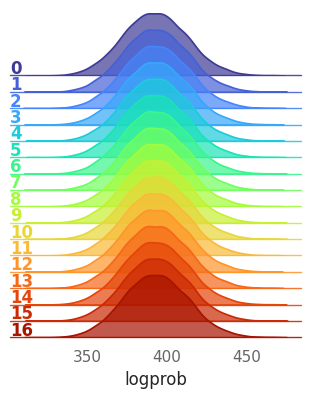

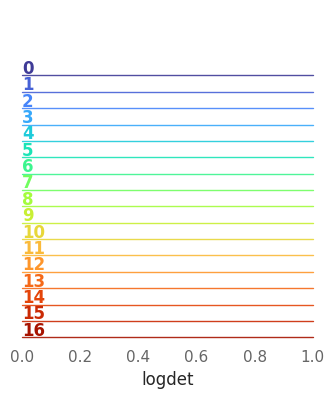

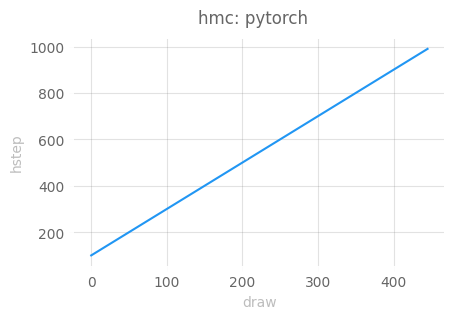

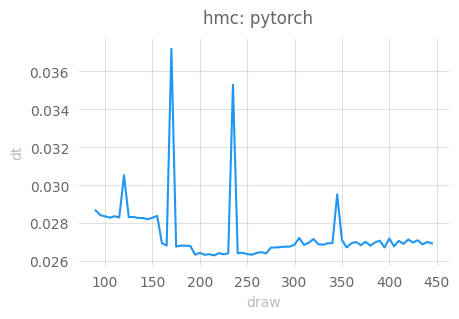

...

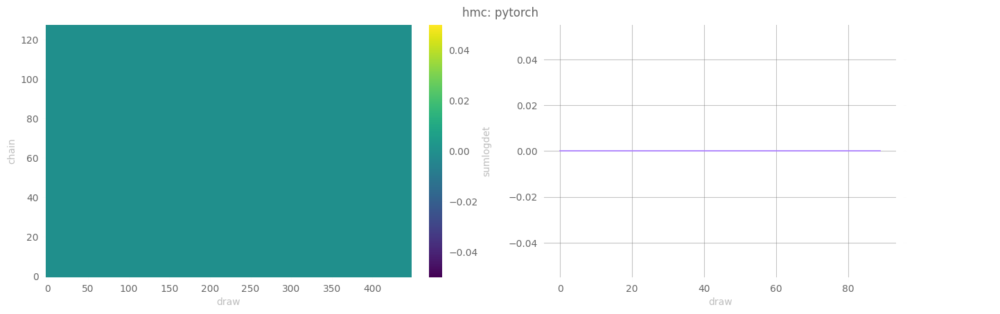

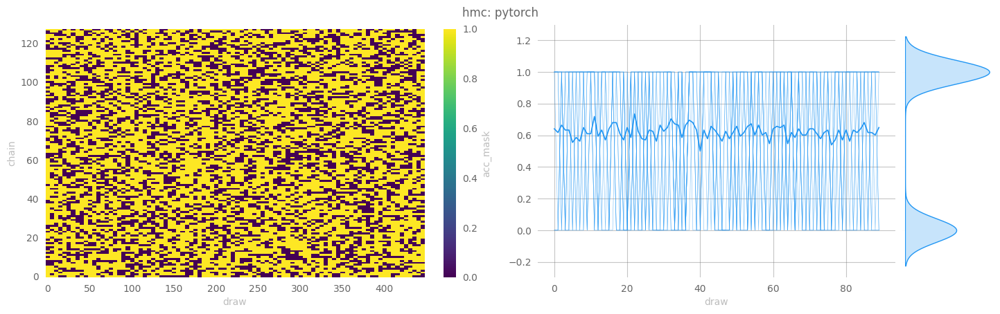

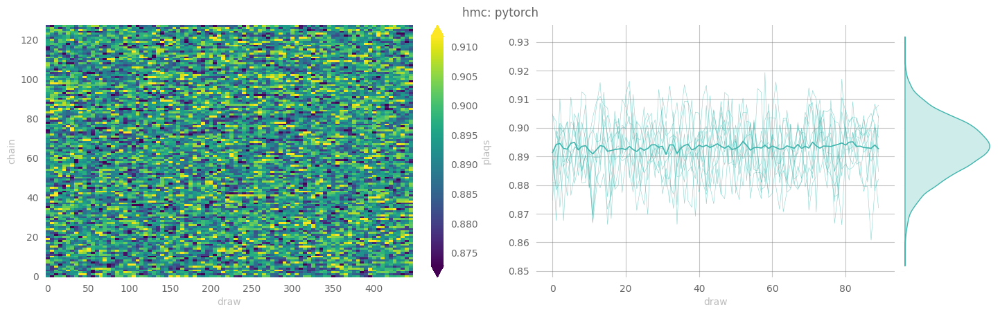

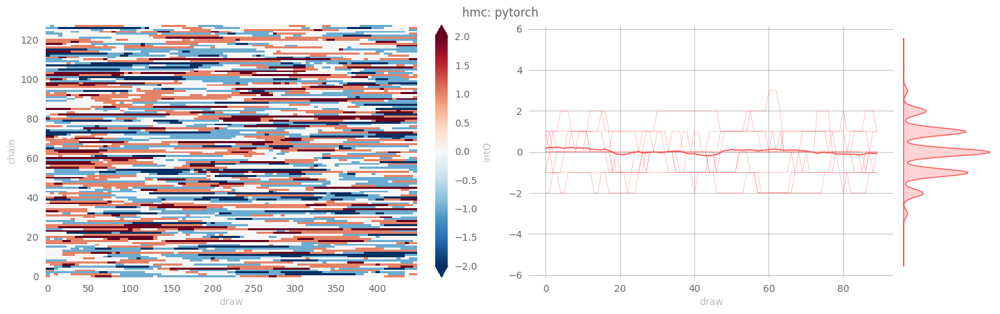

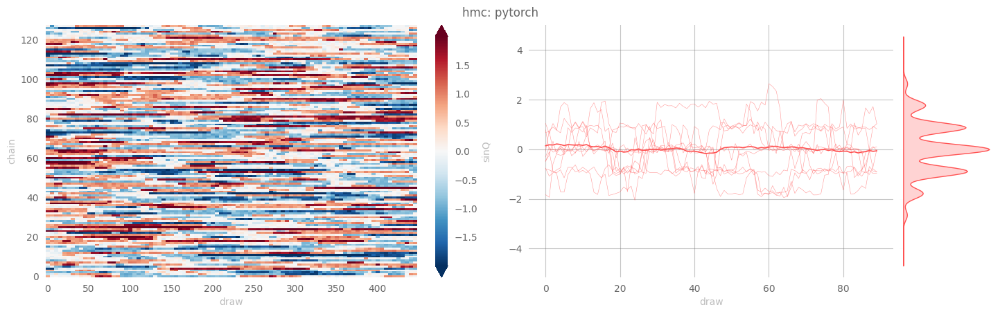

In [13]:
outputs['pytorch']['hmc'] = ptExpU1.evaluate(
    job_type='hmc',
    nchains=128,
    eval_steps=1000,
    nprint=100,
)

# TensorFlow

14:18:51 INFO     Looking for checkpoints in: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/proje ]8;id=978138;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=733360;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#240\240]8;;\
                  cts/l2hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-Tru               
                  e/4-8-16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow                                    

         WARNING  Restored checkpoint from: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/project ]8;id=332383;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=990957;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#250\250]8;;\
                  s/l2hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/               
                  4-8-16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow/ckpt-5                               

─────────────────────────────────────────────── ERA: 0 / 5, BETA: 4.000 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

14:20:15 INFO     era=0   epoch=0   tstep=3500.0000 dt=79.5604 beta=4.0000 loss=-611.7028 dQsin=1.9831    ]8;id=483219;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=613395;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#832\832]8;;\
                  dQint=4.7129 energy=1274.5062 logprob=1274.5039 logdet=0.0022 sldf=0.0052 sldb=-0.0030                
                  sld=0.0022 xeps=0.2091 veps=0.1625 acc=0.9991 sumlogdet=-0.0017 acc_mask=0.9990                       
                  plaqs=-0.0006 intQ=-0.1201 sinQ=-0.0303 lr=0.0010                                                     

14:21:21 INFO     era=0   epoch=50  tstep=3550.0000 dt=0.3986 beta=4.0000 loss=-20.6272 dQsin=0.2496      ]8;id=269933;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=898112;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#832\832]8;;\
                  dQint=0.2349 energy=404.4126 logprob=404.4027 logdet=0.0099 sldf=0.0151 sldb=-0.0052                  
                  sld=0.0099 xeps=0.2092 veps=0.1635 acc=0.4101 sumlogdet=0.0006 acc_mask=0.4126                        
                  plaqs=0.8622 intQ=0.0566 sinQ=0.0457 lr=0.0010                                                        

14:22:22 INFO     Saving took: 0.890097s                                                                 ]8;id=76545;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=447012;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1007\1007]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=995628;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=106213;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1008\1008]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow                                         

         INFO     Era 0 took: 210.794s                                                                   ]8;id=415914;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=739099;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1009\1009]8;;\

─────────────────────────────────────────────── ERA: 1 / 5, BETA: 4.250 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

14:22:26 INFO     era=1   epoch=0   tstep=3600.0000 dt=0.3874 beta=4.2500 loss=-22.4944 dQsin=0.2807      ]8;id=929506;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=930457;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#832\832]8;;\
                  dQint=0.2554 energy=411.4220 logprob=411.4163 logdet=0.0057 sldf=0.0115 sldb=-0.0059                  
                  sld=0.0057 xeps=0.2097 veps=0.1641 acc=0.5263 sumlogdet=0.0006 acc_mask=0.5220                        
                  plaqs=0.8638 intQ=0.0005 sinQ=-0.0015 lr=0.0010                                                       

14:23:31 INFO     era=1   epoch=50  tstep=3650.0000 dt=0.4346 beta=4.2500 loss=-15.0514 dQsin=0.2294      ]8;id=481894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=524830;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#832\832]8;;\
                  dQint=0.1875 energy=401.2087 logprob=401.2063 logdet=0.0024 sldf=0.0063 sldb=-0.0039                  
                  sld=0.0024 xeps=0.2090 veps=0.1660 acc=0.5130 sumlogdet=-0.0014 acc_mask=0.5161                       
                  plaqs=0.8727 intQ=0.0547 sinQ=0.0531 lr=0.0010                                                        

14:24:32 INFO     Saving took: 0.80408s                                                                  ]8;id=247807;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=858292;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1007\1007]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=836294;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=378802;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1008\1008]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow                                         

         INFO     Era 1 took: 130.114s                                                                   ]8;id=976250;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=900397;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1009\1009]8;;\

         INFO     Avgs over last era:                                                                     ]8;id=215042;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=932891;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#974\974]8;;\
                   tstep=3647.5000, dt=0.3898, beta=4.2500, loss=-16.7138, dQsin=0.2425, dQint=0.2042,                  
                  energy=402.1483, logprob=402.1441, logdet=0.0041, sldf=0.0090, sldb=-0.0048,                          
                  sld=0.0041, xeps=0.2091, veps=0.1659, acc=0.5259, sumlogdet=-0.0001, acc_mask=0.5274,                 
                  plaqs=0.8717, intQ=0.0198, sinQ=0.0165, lr=0.0010                                                     
                                                                                                                        

─────────────────────────────────────────────── ERA: 2 / 5, BETA: 4.500 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

14:24:36 INFO     era=2   epoch=0   tstep=3700.0000 dt=0.3875 beta=4.5000 loss=-12.7620 dQsin=0.2275      ]8;id=736536;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=441632;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#832\832]8;;\
                  dQint=0.1733 energy=409.1038 logprob=409.1015 logdet=0.0023 sldf=0.0047 sldb=-0.0025                  
                  sld=0.0023 xeps=0.2085 veps=0.1676 acc=0.5677 sumlogdet=0.0001 acc_mask=0.5752                        
                  plaqs=0.8727 intQ=-0.0225 sinQ=-0.0182 lr=0.0010                                                      

14:25:41 INFO     era=2   epoch=50  tstep=3750.0000 dt=0.3848 beta=4.5000 loss=-9.4086 dQsin=0.2017       ]8;id=183175;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=998815;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#832\832]8;;\
                  dQint=0.1450 energy=400.3874 logprob=400.3863 logdet=0.0011 sldf=0.0022 sldb=-0.0011                  
                  sld=0.0011 xeps=0.2088 veps=0.1673 acc=0.5646 sumlogdet=-0.0002 acc_mask=0.5635                       
                  plaqs=0.8804 intQ=-0.0449 sinQ=-0.0351 lr=0.0010                                                      

14:26:42 INFO     Saving took: 0.751631s                                                                 ]8;id=612905;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=213133;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1007\1007]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=316436;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=63240;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1008\1008]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow                                         

         INFO     Era 2 took: 130.072s                                                                   ]8;id=852336;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=369608;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1009\1009]8;;\

         INFO     Avgs over last era:                                                                     ]8;id=560296;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=160495;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#974\974]8;;\
                   tstep=3747.5000, dt=0.3877, beta=4.5000, loss=-9.2507, dQsin=0.1986, dQint=0.1459,                   
                  energy=401.2404, logprob=401.2392, logdet=0.0013, sldf=0.0025, sldb=-0.0012,                          
                  sld=0.0013, xeps=0.2089, veps=0.1674, acc=0.5493, sumlogdet=-0.0001, acc_mask=0.5479,                 
                  plaqs=0.8797, intQ=-0.0254, sinQ=-0.0215, lr=0.0010                                                   
                                                                                                                        

─────────────────────────────────────────────── ERA: 3 / 5, BETA: 4.750 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

14:26:47 INFO     era=3   epoch=0   tstep=3800.0000 dt=0.3883 beta=4.7500 loss=-5.3127 dQsin=0.1723       ]8;id=523855;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=950492;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#832\832]8;;\
                  dQint=0.1123 energy=408.7252 logprob=408.7245 logdet=0.0007 sldf=0.0016 sldb=-0.0009                  
                  sld=0.0007 xeps=0.2093 veps=0.1673 acc=0.5518 sumlogdet=-0.0011 acc_mask=0.5547                       
                  plaqs=0.8807 intQ=-0.0498 sinQ=-0.0412 lr=0.0010                                                      

14:27:51 INFO     era=3   epoch=50  tstep=3850.0000 dt=0.4008 beta=4.7500 loss=-1.7652 dQsin=0.1550       ]8;id=810890;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=997075;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#832\832]8;;\
                  dQint=0.1025 energy=400.2486 logprob=400.2482 logdet=0.0004 sldf=0.0010 sldb=-0.0006                  
                  sld=0.0004 xeps=0.2100 veps=0.1663 acc=0.5461 sumlogdet=-0.0007 acc_mask=0.5444                       
                  plaqs=0.8871 intQ=-0.0039 sinQ=-0.0005 lr=0.0010                                                      

14:28:52 INFO     Saving took: 0.747769s                                                                 ]8;id=575700;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=495385;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1007\1007]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=349970;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=145467;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1008\1008]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow                                         

         INFO     Era 3 took: 130.155s                                                                   ]8;id=137293;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=50407;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1009\1009]8;;\

         INFO     Avgs over last era:                                                                     ]8;id=654841;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=173098;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#974\974]8;;\
                   tstep=3847.5000, dt=0.3910, beta=4.7500, loss=-3.4726, dQsin=0.1644, dQint=0.1078,                   
                  energy=401.3848, logprob=401.3840, logdet=0.0008, sldf=0.0013, sldb=-0.0005,                          
                  sld=0.0008, xeps=0.2101, veps=0.1664, acc=0.5391, sumlogdet=-0.0000, acc_mask=0.5413,                 
                  plaqs=0.8866, intQ=-0.0265, sinQ=-0.0215, lr=0.0010                                                   
                                                                                                                        

─────────────────────────────────────────────── ERA: 4 / 5, BETA: 5.000 ────────────────────────────────────────────────

  0%|          | 0/100 [00:00<?, ?it/s]

14:28:57 INFO     era=4   epoch=0   tstep=3900.0000 dt=0.3872 beta=5.0000 loss=-1.7280 dQsin=0.1566       ]8;id=970295;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=151968;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#832\832]8;;\
                  dQint=0.0957 energy=408.5385 logprob=408.5372 logdet=0.0014 sldf=0.0021 sldb=-0.0007                  
                  sld=0.0014 xeps=0.2108 veps=0.1658 acc=0.5500 sumlogdet=0.0004 acc_mask=0.5415                        
                  plaqs=0.8871 intQ=0.0015 sinQ=0.0009 lr=0.0010                                                        

14:30:01 INFO     era=4   epoch=50  tstep=3950.0000 dt=0.3868 beta=5.0000 loss=2.4638 dQsin=0.1272        ]8;id=883256;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=572590;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#832\832]8;;\
                  dQint=0.0703 energy=400.7578 logprob=400.7575 logdet=0.0004 sldf=0.0010 sldb=-0.0006                  
                  sld=0.0004 xeps=0.2112 veps=0.1652 acc=0.5274 sumlogdet=-0.0004 acc_mask=0.5322                       
                  plaqs=0.8937 intQ=-0.0039 sinQ=-0.0052 lr=0.0010                                                      

14:31:03 INFO     Saving took: 0.764657s                                                                 ]8;id=73137;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=748472;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1007\1007]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=341086;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=179331;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1008\1008]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow                                         

         INFO     Era 4 took: 130.196s                                                                   ]8;id=1789;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=700700;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1009\1009]8;;\

14:31:52 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=707471;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=63779;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/train/plots/ridg                    
                  eplots/energy_ridgeplot.svg                                                                           

14:32:43 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=669285;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=91876;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/train/plots/ridg                    
                  eplots/logprob_ridgeplot.svg                                                                          

14:33:34 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=794724;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=830580;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/train/plots/ridg                    
                  eplots/logdet_ridgeplot.svg                                                                           

14:34:25 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=155476;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=960003;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/train/plots/ridg                    
                  eplots/sldf_ridgeplot.svg                                                                             

14:35:08 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=227576;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=41850;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/train/plots/ridg                    
                  eplots/sldb_ridgeplot.svg                                                                             

14:35:58 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=453794;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=410455;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/train/plots/ridg                    
                  eplots/sld_ridgeplot.svg                                                                              

14:36:18 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=772512;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=340169;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/train/data/train_data.h5                 

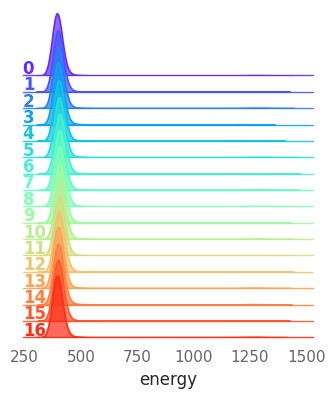

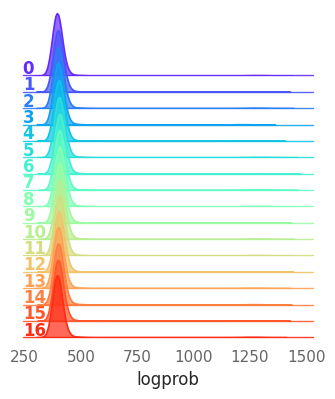

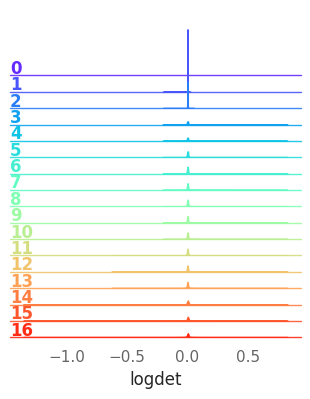

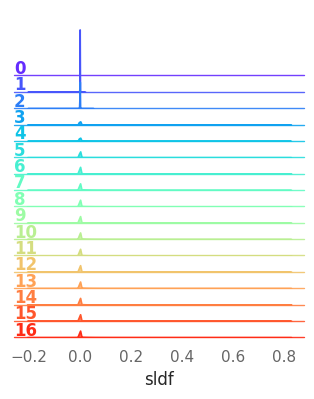

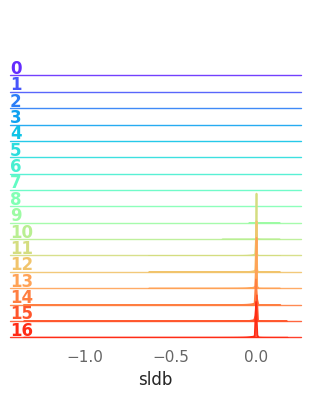

...

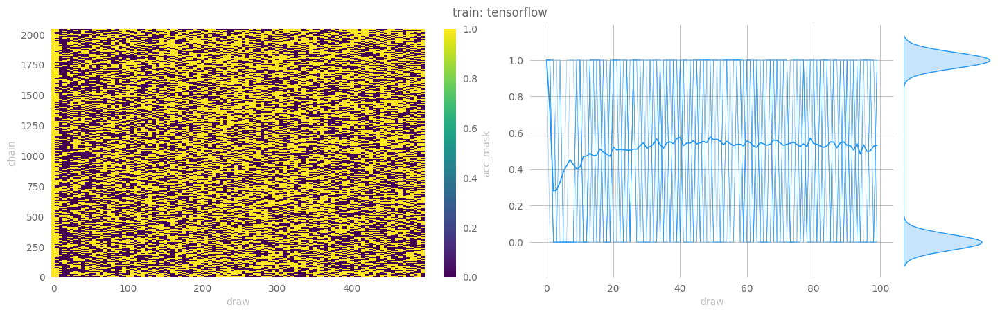

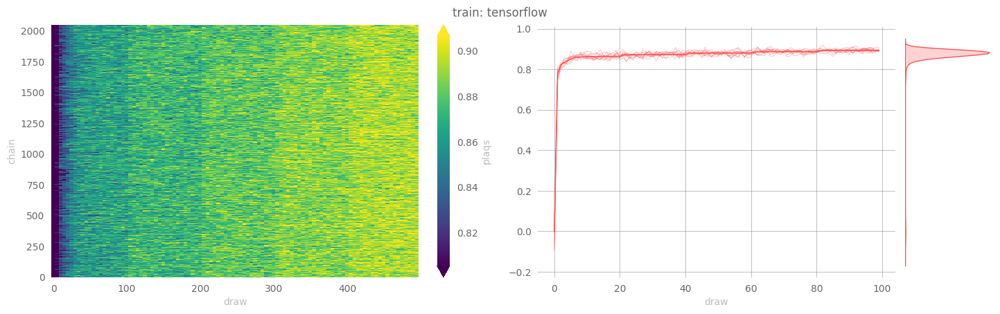

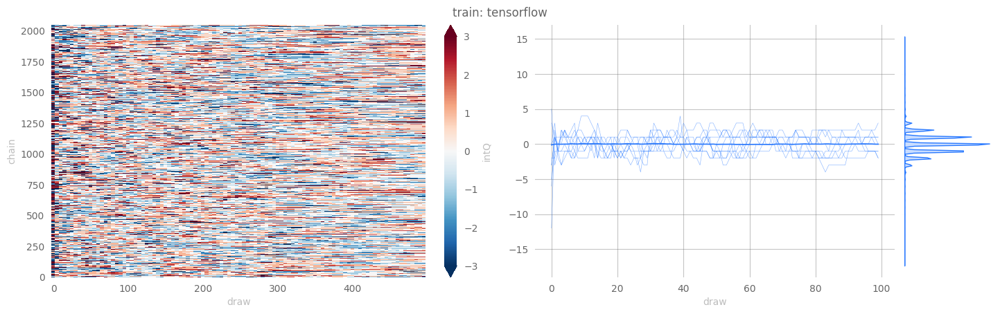

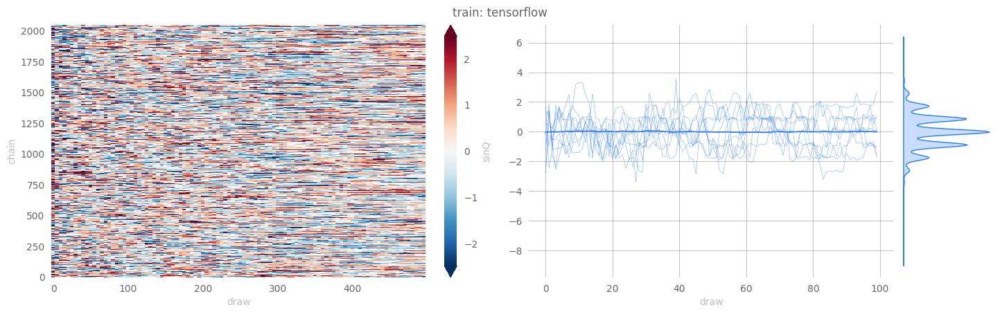

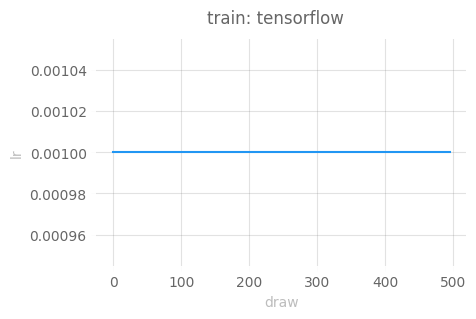

In [14]:
warnings.filterwarnings('ignore')
with sns.plotting_context("talk"):
    outputs['tensorflow']['train'] = tfExpU1.train()

14:39:18 WARNING  x.shape (original): (2048, 2, 16, 16)                                                   ]8;id=217180;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=707484;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#498\498]8;;\

         WARNING  x[:nchains].shape: (128, 2, 16, 16)                                                     ]8;id=399718;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=916755;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#504\504]8;;\

         INFO     eps = None                                                                              ]8;id=959679;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=563596;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#536\536]8;;\
                  beta = 5.0                                                                                            
                  nlog = 10                                                                                             
                  table = <rich.table.Table object at 0x7f8fb8beedf0>                                                   
                  nprint = 100                                                                                          
                  eval_steps = 1000                                                                                     
                  nleapfrog = None                                                                                      

14:39:30 INFO     estep=0   dt=12.2406 beta=5.0000 loss=-587.2487 dQsin=1.8221 dQint=4.6484               ]8;id=662537;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=319327;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  energy=1528.7937 logprob=1528.7937 logdet=-0.0001 sldf=0.0016 sldb=-0.0017 sld=-0.0001                
                  xeps=0.2115 veps=0.1649 acc=0.9396 sumlogdet=-0.0007 acc_mask=0.9375 plaqs=0.0093                     
                  intQ=0.7578 sinQ=0.2677                                                                               

14:39:48 INFO     estep=100 dt=0.0537 beta=5.0000 loss=10.2674 dQsin=0.0989 dQint=0.0234 energy=399.2405  ]8;id=442537;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=334446;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=399.2398 logdet=0.0008 sldf=0.0006 sldb=0.0002 sld=0.0008 xeps=0.2115                         
                  veps=0.1649 acc=0.4640 sumlogdet=0.0007 acc_mask=0.5469 plaqs=0.8951 intQ=0.0547                      
                  sinQ=0.0604                                                                                           

14:39:56 INFO     estep=200 dt=0.0535 beta=5.0000 loss=1.6832 dQsin=0.1534 dQint=0.1250 energy=400.3789   ]8;id=718557;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=605814;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=400.3801 logdet=-0.0012 sldf=-0.0007 sldb=-0.0005 sld=-0.0012 xeps=0.2115                     
                  veps=0.1649 acc=0.5210 sumlogdet=-0.0020 acc_mask=0.5156 plaqs=0.8953 intQ=0.1016                     
                  sinQ=0.0792                                                                                           

14:40:03 INFO     estep=300 dt=0.0535 beta=5.0000 loss=0.3499 dQsin=0.1530 dQint=0.0938 energy=400.8643   ]8;id=888048;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=158772;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=400.8647 logdet=-0.0003 sldf=0.0005 sldb=-0.0009 sld=-0.0003 xeps=0.2115                      
                  veps=0.1649 acc=0.5461 sumlogdet=-0.0023 acc_mask=0.5547 plaqs=0.8934 intQ=0.1406                     
                  sinQ=0.1190                                                                                           

14:40:10 INFO     estep=400 dt=0.0540 beta=5.0000 loss=-1.8203 dQsin=0.1518 dQint=0.0938 energy=398.6025  ]8;id=879511;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=558513;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=398.6030 logdet=-0.0005 sldf=-0.0006 sldb=0.0001 sld=-0.0005 xeps=0.2115                      
                  veps=0.1649 acc=0.5013 sumlogdet=0.0000 acc_mask=0.4766 plaqs=0.8944 intQ=0.0703                      
                  sinQ=0.0521                                                                                           

14:40:17 INFO     estep=500 dt=0.0540 beta=5.0000 loss=2.1555 dQsin=0.1194 dQint=0.0703 energy=398.9788   ]8;id=97380;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=801472;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=398.9785 logdet=0.0003 sldf=0.0004 sldb=-0.0001 sld=0.0003 xeps=0.2115                        
                  veps=0.1649 acc=0.5075 sumlogdet=0.0001 acc_mask=0.4688 plaqs=0.8937 intQ=-0.1016                     
                  sinQ=-0.0960                                                                                          

14:40:24 INFO     estep=600 dt=0.0554 beta=5.0000 loss=5.7299 dQsin=0.1248 dQint=0.0703 energy=400.0877   ]8;id=272960;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=291525;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=400.0872 logdet=0.0004 sldf=0.0004 sldb=-0.0000 sld=0.0004 xeps=0.2115                        
                  veps=0.1649 acc=0.4958 sumlogdet=-0.0005 acc_mask=0.5078 plaqs=0.8926 intQ=-0.0625                    
                  sinQ=-0.0402                                                                                          

14:40:31 INFO     estep=700 dt=0.0534 beta=5.0000 loss=6.9998 dQsin=0.1119 dQint=0.0547 energy=398.2441   ]8;id=430186;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=419500;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=398.2433 logdet=0.0007 sldf=0.0013 sldb=-0.0006 sld=0.0007 xeps=0.2115                        
                  veps=0.1649 acc=0.5397 sumlogdet=-0.0005 acc_mask=0.5625 plaqs=0.8941 intQ=-0.0312                    
                  sinQ=-0.0186                                                                                          

14:40:38 INFO     estep=800 dt=0.0534 beta=5.0000 loss=0.4123 dQsin=0.1679 dQint=0.1094 energy=400.6355   ]8;id=899494;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=592385;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=400.6350 logdet=0.0005 sldf=0.0008 sldb=-0.0003 sld=0.0005 xeps=0.2115                        
                  veps=0.1649 acc=0.4714 sumlogdet=0.0014 acc_mask=0.5469 plaqs=0.8946 intQ=-0.0234                     
                  sinQ=-0.0195                                                                                          

14:40:47 INFO     estep=900 dt=0.0534 beta=5.0000 loss=-0.6075 dQsin=0.1110 dQint=0.0703 energy=398.5168  ]8;id=290185;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=551341;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=398.5170 logdet=-0.0002 sldf=-0.0005 sldb=0.0003 sld=-0.0002 xeps=0.2115                      
                  veps=0.1649 acc=0.4770 sumlogdet=0.0002 acc_mask=0.4219 plaqs=0.8941 intQ=0.0859                      
                  sinQ=0.0761                                                                                           

14:40:57 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=119263;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=735742;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/eval/plots/ridge                    
                  plots/energy_ridgeplot.svg                                                                            

14:41:02 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=393581;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=287546;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/eval/plots/ridge                    
                  plots/logprob_ridgeplot.svg                                                                           

14:41:07 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=224275;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=311894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/eval/plots/ridge                    
                  plots/logdet_ridgeplot.svg                                                                            

14:41:13 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=751028;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=877797;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/eval/plots/ridge                    
                  plots/sldf_ridgeplot.svg                                                                              

14:41:18 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=616048;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=417688;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/eval/plots/ridge                    
                  plots/sldb_ridgeplot.svg                                                                              

14:41:23 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=55049;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=366504;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/eval/plots/ridge                    
                  plots/sld_ridgeplot.svg                                                                               

14:41:34 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=920052;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=875047;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/eval/data/eval_data.h5                   

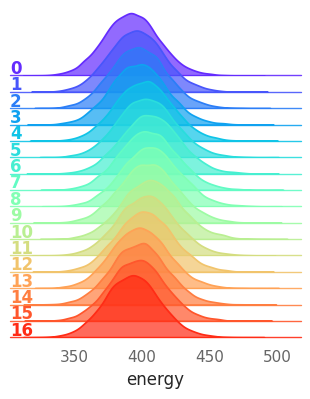

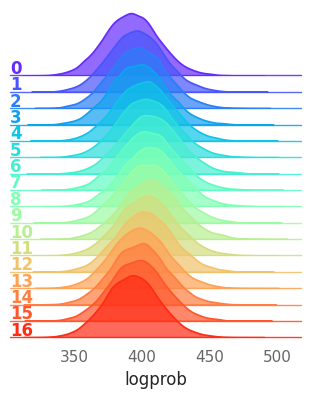

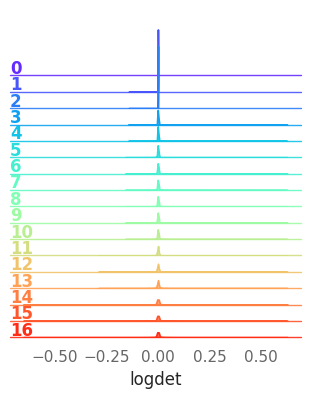

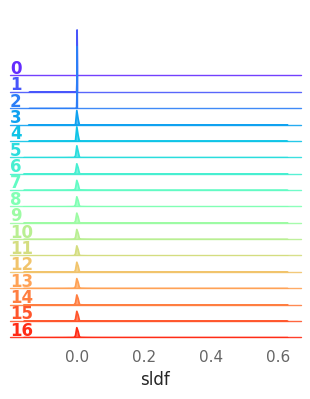

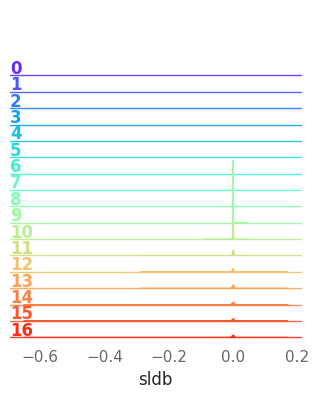

...

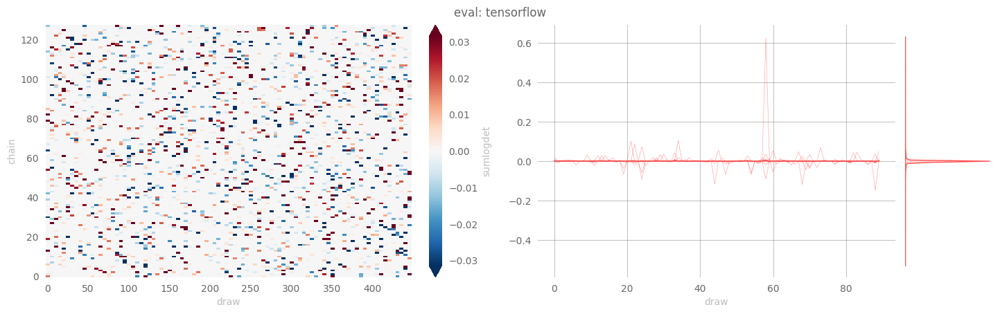

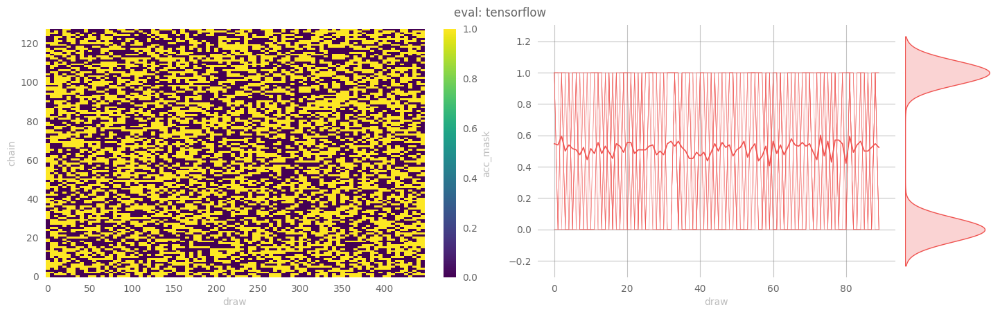

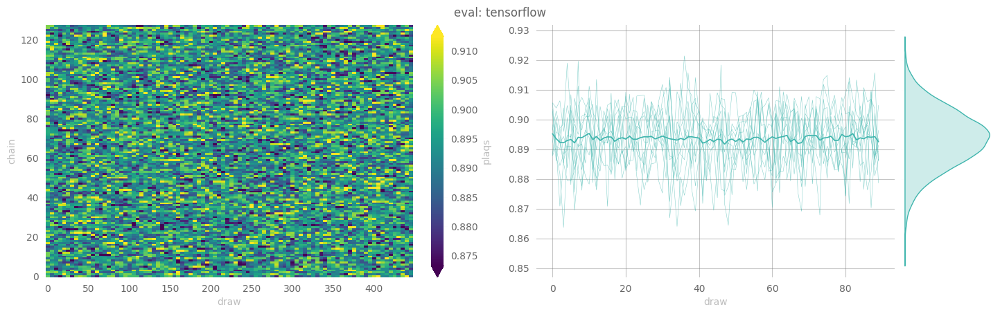

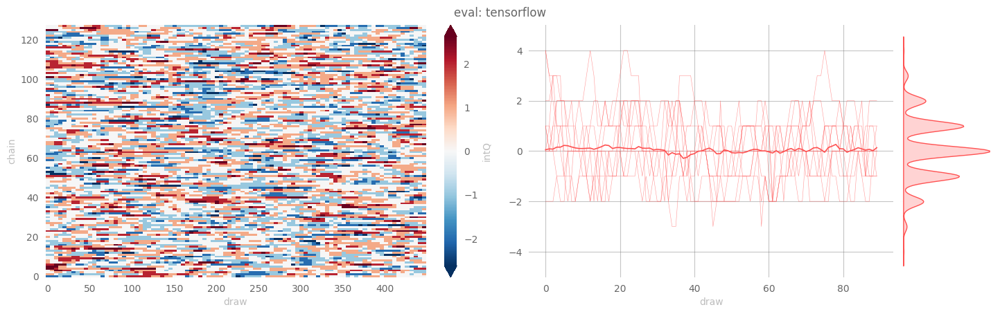

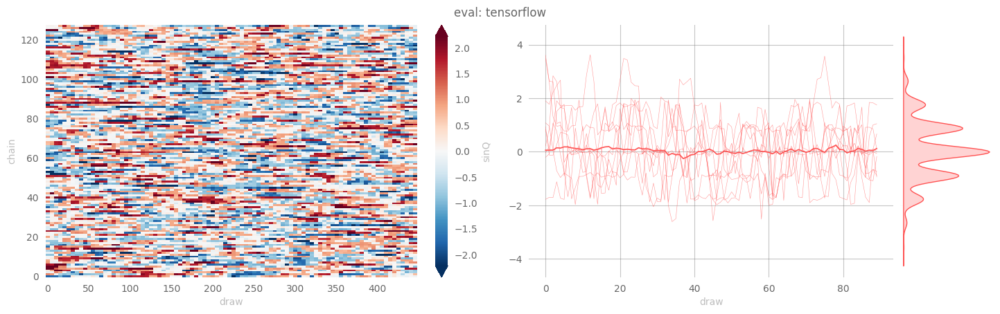

In [15]:
outputs['tensorflow']['eval'] = tfExpU1.evaluate(
    job_type='eval',
    nprint=100,
    nchains=128,
    eval_steps=1000,
)

14:41:43 WARNING  Step size `eps` not specified for HMC! Using default: 0.1250 for generic HMC            ]8;id=461955;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=814625;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#490\490]8;;\

         WARNING  x.shape (original): (2048, 2, 16, 16)                                                   ]8;id=514327;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=173351;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#498\498]8;;\

         WARNING  x[:nchains].shape: (128, 2, 16, 16)                                                     ]8;id=399026;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=322874;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#504\504]8;;\

         INFO     eps = 0.125                                                                             ]8;id=2567;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=76888;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#536\536]8;;\
                  beta = 5.0                                                                                            
                  nlog = 10                                                                                             
                  table = <rich.table.Table object at 0x7fa48c64dbb0>                                                   
                  nprint = 100                                                                                          
                  eval_steps = 1000                                                                                     
                  nleapfrog = 16                                                                                        

14:41:44 INFO     hstep=0   dt=0.1228 beta=5.0000 loss=-674.3973 dQsin=2.1106 dQint=4.4141                ]8;id=503533;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=414177;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  energy=1517.5155 logprob=1517.5155 logdet=0.0000 acc=1.0000 sumlogdet=0.0000                          
                  acc_mask=1.0000 plaqs=0.0018 intQ=0.2187 sinQ=0.0479                                                  

14:41:56 INFO     hstep=100 dt=0.1029 beta=5.0000 loss=4.1781 dQsin=0.1185 dQint=0.0391 energy=396.4511   ]8;id=312917;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=449745;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=396.4511 logdet=0.0000 acc=0.6137 sumlogdet=0.0000 acc_mask=0.5859 plaqs=0.8920               
                  intQ=0.0156 sinQ=0.0201                                                                               

14:42:07 INFO     hstep=200 dt=0.0973 beta=5.0000 loss=10.1011 dQsin=0.0987 dQint=0.0078 energy=393.3406  ]8;id=882758;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=715963;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=393.3406 logdet=0.0000 acc=0.6204 sumlogdet=0.0000 acc_mask=0.6719 plaqs=0.8927               
                  intQ=0.0469 sinQ=0.0278                                                                               

14:42:18 INFO     hstep=300 dt=0.0972 beta=5.0000 loss=5.0018 dQsin=0.1039 dQint=0.0313 energy=394.2648   ]8;id=867854;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=502884;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=394.2648 logdet=0.0000 acc=0.6119 sumlogdet=0.0000 acc_mask=0.5938 plaqs=0.8927               
                  intQ=-0.0312 sinQ=-0.0248                                                                             

14:42:29 INFO     hstep=400 dt=0.0972 beta=5.0000 loss=6.3971 dQsin=0.0886 dQint=0.0078 energy=393.5541   ]8;id=194593;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=419967;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=393.5541 logdet=0.0000 acc=0.6155 sumlogdet=0.0000 acc_mask=0.5703 plaqs=0.8929               
                  intQ=0.0156 sinQ=0.0168                                                                               

14:42:40 INFO     hstep=500 dt=0.0974 beta=5.0000 loss=5.5875 dQsin=0.1051 dQint=0.0078 energy=390.6506   ]8;id=658935;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=501179;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=390.6506 logdet=0.0000 acc=0.6307 sumlogdet=0.0000 acc_mask=0.6016 plaqs=0.8927               
                  intQ=0.0000 sinQ=-0.0023                                                                              

14:42:51 INFO     hstep=600 dt=1.1360 beta=5.0000 loss=8.8868 dQsin=0.0972 dQint=0.0078 energy=394.7395   ]8;id=164826;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=294922;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=394.7395 logdet=0.0000 acc=0.5874 sumlogdet=0.0000 acc_mask=0.6250 plaqs=0.8933               
                  intQ=-0.0234 sinQ=-0.0318                                                                             

14:43:02 INFO     hstep=700 dt=0.0973 beta=5.0000 loss=8.3038 dQsin=0.0663 dQint=0.0000 energy=391.2501   ]8;id=620235;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=387475;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=391.2501 logdet=0.0000 acc=0.5654 sumlogdet=0.0000 acc_mask=0.5391 plaqs=0.8960               
                  intQ=-0.1016 sinQ=-0.0904                                                                             

14:43:13 INFO     hstep=800 dt=0.0971 beta=5.0000 loss=5.1562 dQsin=0.1092 dQint=0.0234 energy=390.6472   ]8;id=687054;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=629663;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=390.6472 logdet=0.0000 acc=0.6106 sumlogdet=0.0000 acc_mask=0.6016 plaqs=0.8932               
                  intQ=-0.1641 sinQ=-0.1492                                                                             

14:43:24 INFO     hstep=900 dt=0.0969 beta=5.0000 loss=9.2974 dQsin=0.0751 dQint=0.0000 energy=393.5219   ]8;id=363312;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=216077;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#653\653]8;;\
                  logprob=393.5219 logdet=0.0000 acc=0.5552 sumlogdet=0.0000 acc_mask=0.5469 plaqs=0.8935               
                  intQ=-0.0703 sinQ=-0.0692                                                                             

14:43:38 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=177190;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=544068;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/hmc/plots/ridgep                    
                  lots/energy_ridgeplot.svg                                                                             

14:43:42 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=974832;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=595616;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/hmc/plots/ridgep                    
                  lots/logprob_ridgeplot.svg                                                                            

14:43:46 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=479636;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=842826;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#936\936]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/hmc/plots/ridgep                    
                  lots/logdet_ridgeplot.svg                                                                             

14:43:56 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=700774;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=497472;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-06-132858/tensorflow/hmc/data/hmc_data.h5                     

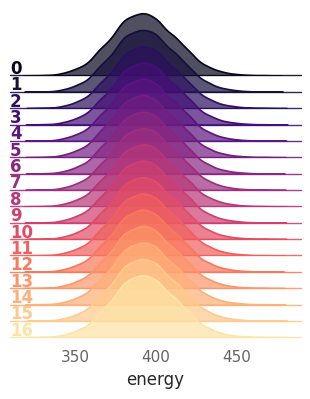

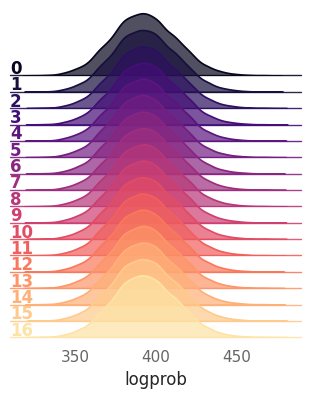

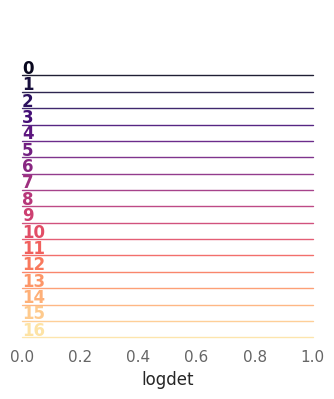

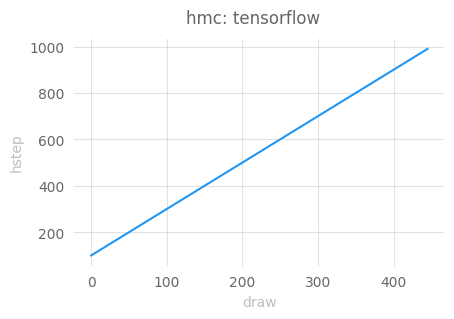

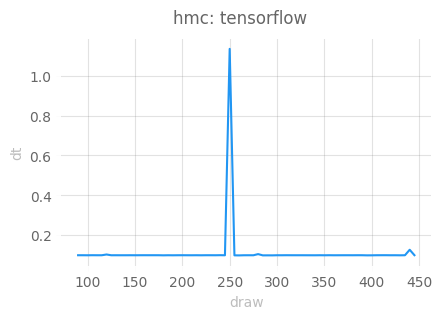

...

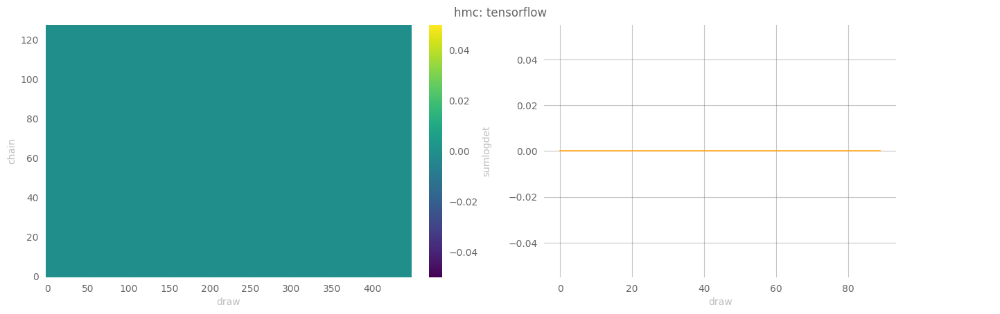

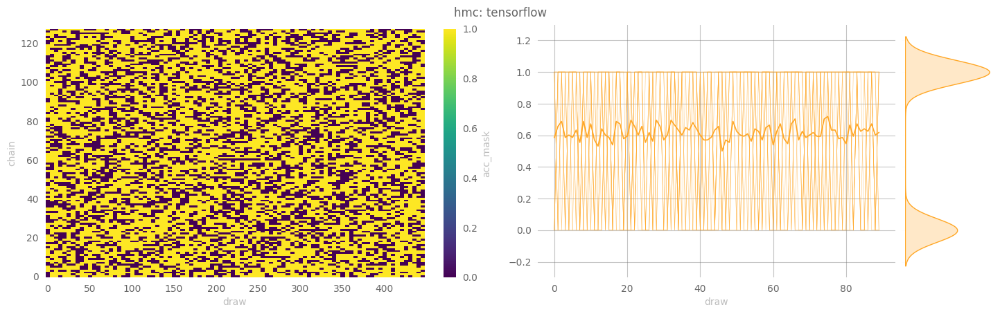

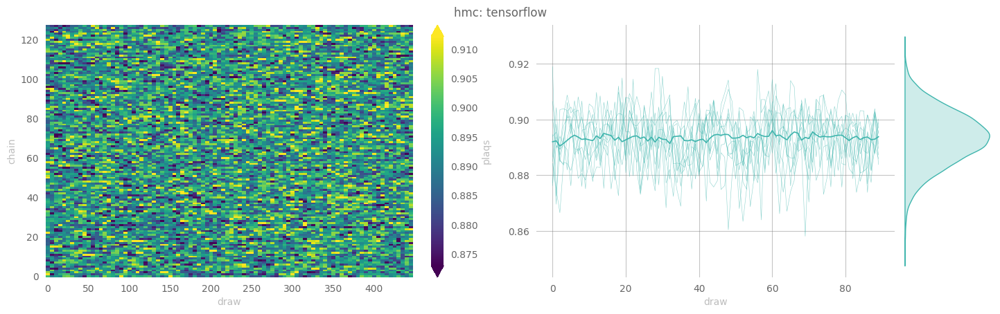

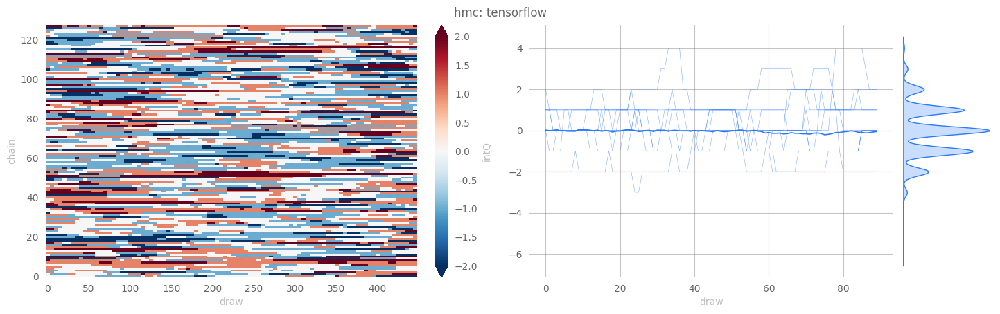

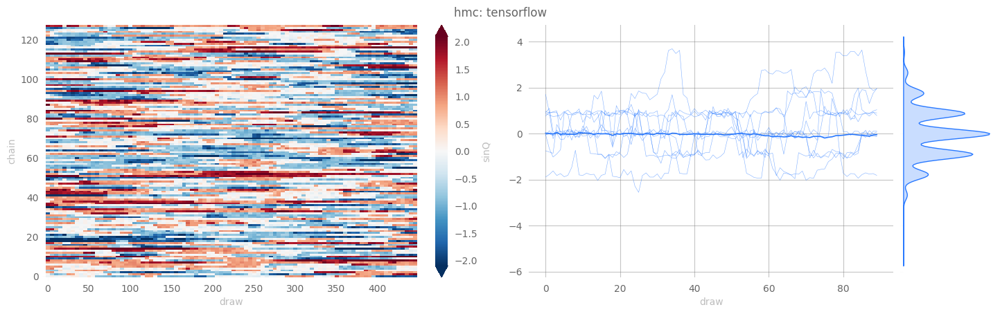

In [16]:
outputs['tensorflow']['hmc'] = tfExpU1.evaluate(
    job_type='hmc',
    nchains=128,
    eval_steps=1000,
    nprint=100,
)

# Model Performance

Our goal is improving the efficiency of our MCMC sampler.

In particular, we are interested in generating **independent** configurations which we can then use to calculate expectation values of physical observables.

For our purposes, we are interested in obtaining lattice configurations from distinct _topological charge sectors_, as characterized by a configurations _topological charge_, $Q$.

Explicitly, HMC is known to suffer from _critical slowing down_, a phenomenon in which our configurations remains stuck in some local topological charge sector and fails to produce distinct configurations.

Because of this, we can assess our models' performance by looking at the _tunneling rate_, i.e. the rate at which our sampler jumps between these different charge sectors.

We can write this quantity as:

$$\delta Q = |Q^{(i)} - Q^{(i-1)}|$$

i.e. look at the difference in the topological charge between sequential configurations.

<div class="alert alert-block alert-info">
<b>Note:</b> 
The efficiency of our sampler is directly proportional to the tunneling rate.
    
Explicitly, this means that the **more efficient** the model $\longrightarrow$
    
- the **larger** tunneling rate
- the **smaller** integrated autocorrelation time for $Q$
</div>

In [17]:
import xarray as xr

def get_thermalized_configs(x: np.ndarray | xr.DataArray) -> np.ndarray | xr.DataArray:
    if isinstance(x, np.ndarray):
        argmax = max(list(set(sorted(np.argmax(x, -1)))))
        return x[..., argmax+1:]
    if isinstance(x, xr.DataArray):
        argmax = max(list(set(sorted(x.argmax('draw').data))))
        return x[..., argmax+1:]
    raise TypeError

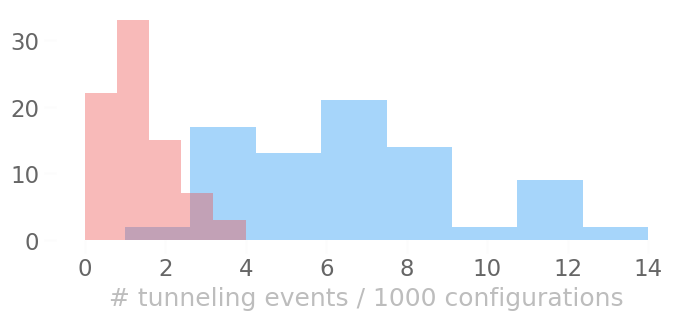

In [49]:
from l2hmc.utils.plot_helpers import COLORS
plt.rcParams['text.usetex'] = False

fig, ax = plt.subplots(figsize=(8, 3))
_ = sns.distplot(dsets['pt']['eval']['dQint'][:, 20:].astype('int').sum('chain').data, kde=False, color=COLORS['blue'])
_ = sns.distplot(dsets['pt']['hmc']['dQint'][:, 20:].astype('int').sum('chain').data, kde=False, color=COLORS['red'])
_ = ax.set_xlabel(f'# tunneling events / 1000 configurations')

# Comparisons

We can measure our models' performance explicitly by looking at the average tunneling rate, $\delta Q_{\mathbb{Z}}$, for our **trained model** and comparing it against generic HMC.

Recall,

$$\delta Q_{\mathbb{Z}} := \big|Q^{(i+1)}_{\mathbb{Z}} - Q^{(i)}_{\mathbb{Z}}\big|$$

where a **higher** value of $\delta Q_{\mathbb{Z}}$ corresponds to **better** tunneling of the topological charge, $Q_{\mathbb{Z}}$.

Note that we can get a concise representation of the data from different parts of our run via:

Note that the data from each of the different parts of our experiment (i.e. `train`, `eval`, and `hmc`) are stored as a dict, e.g.

```python
>>> list(ptExpU1.trainer.histories.keys())
['train', 'eval', 'hmc']
>>> train_history = ptExpU1.trainer.histories['train']
>>> train_dset = train_history.get_dataset()
>>> assert isinstance(train_history, l2hmc.utils.history.BaseHistory)
>>> assert isinstance(train_dset, xarray.Dataset)
```

(see below, for example)

In [111]:
dsets['pt']['train']

<xarray.Dataset>
Dimensions:    (draw: 100, chain: 2048, leapfrog: 17)
Coordinates:
  * draw       (draw) int64 0 1 2 3 4 5 6 7 8 9 ... 91 92 93 94 95 96 97 98 99
  * chain      (chain) int64 0 1 2 3 4 5 6 ... 2042 2043 2044 2045 2046 2047
  * leapfrog   (leapfrog) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16
Data variables: (12/23)
    era        (draw) int64 0 0 0 0 0 0 0 0 0 0 0 0 ... 4 4 4 4 4 4 4 4 4 4 4 4
    epoch      (draw) int64 0 5 10 15 20 25 30 35 40 ... 60 65 70 75 80 85 90 95
    tstep      (draw) int64 0 5 10 15 20 25 30 ... 465 470 475 480 485 490 495
    dt         (draw) float64 2.905 1.403 1.399 1.398 ... 0.6957 0.7038 0.6973
    beta       (draw) float64 4.0 4.0 4.0 4.0 4.0 4.0 ... 5.0 5.0 5.0 5.0 5.0
    loss       (draw) float64 -614.6 -219.5 -74.95 -42.55 ... 3.709 3.373 2.643
    ...         ...
    sumlogdet  (chain, draw) float32 -2.455 -0.0 -0.1554 ... -0.009792 0.7952
    acc_mask   (chain, draw) float32 1.0 0.0 1.0 0.0 0.0 ... 0.0 0.0 0.0 1.0 1.0
    plaqs      (chain, draw) float32 0.0174 0.5874 0.7751 ... 0.8892 0.8978
    intQ       (chain, draw) float32 -5.0 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
    sinQ       (chain, draw) float32 -1.036 0.05601 1.507 ... 0.9288 0.8105
    lr         (draw) float64 0.001 0.001 0.001 0.001 ... 0.001 0.001 0.001

We aggregate the data into the `dsets` dict below, grouped by:

1. **Framework** (`pytorch` / `tensorflow`)
2. **Job type** (`train`, `eval`, `hmc`)

In [112]:
import logging
log = logging.getLogger(__name__)
dsets = {}
fws = ['pt', 'tf']
modes = ['train', 'eval', 'hmc']
for fw in fws:
    dsets[fw] = {}
    for mode in modes:
        hist = None
        if fw == 'pt':
            hist = ptExpU1.trainer.histories.get(mode, None)
        elif fw == 'tf':
            hist = tfExpU1.trainer.histories.get(mode, None)
        if hist is not None:
            log.info(f'Getting dataset for {fw}: {mode}')
            dsets[fw][mode] = hist.get_dataset()

15:34:27 INFO     Getting dataset for pt: train                                                         ]8;id=389453;file:///tmp/ipykernel_3520770/2324717418.py\2324717418.py]8;;\:]8;id=435160;file:///tmp/ipykernel_3520770/2324717418.py#15\15]8;;\

         INFO     Getting dataset for pt: eval                                                          ]8;id=182504;file:///tmp/ipykernel_3520770/2324717418.py\2324717418.py]8;;\:]8;id=78291;file:///tmp/ipykernel_3520770/2324717418.py#15\15]8;;\

         INFO     Getting dataset for pt: hmc                                                           ]8;id=670485;file:///tmp/ipykernel_3520770/2324717418.py\2324717418.py]8;;\:]8;id=18673;file:///tmp/ipykernel_3520770/2324717418.py#15\15]8;;\

         INFO     Getting dataset for tf: train                                                         ]8;id=222581;file:///tmp/ipykernel_3520770/2324717418.py\2324717418.py]8;;\:]8;id=812994;file:///tmp/ipykernel_3520770/2324717418.py#15\15]8;;\

         INFO     Getting dataset for tf: eval                                                          ]8;id=205992;file:///tmp/ipykernel_3520770/2324717418.py\2324717418.py]8;;\:]8;id=875466;file:///tmp/ipykernel_3520770/2324717418.py#15\15]8;;\

         INFO     Getting dataset for tf: hmc                                                           ]8;id=634549;file:///tmp/ipykernel_3520770/2324717418.py\2324717418.py]8;;\:]8;id=650559;file:///tmp/ipykernel_3520770/2324717418.py#15\15]8;;\

## TensorFlow Results

15:43:01 INFO     TensorFlow, EVAL                                                                        ]8;id=777804;file:///tmp/ipykernel_3520770/26240638.py\26240638.py]8;;\:]8;id=853037;file:///tmp/ipykernel_3520770/26240638.py#21\21]8;;\
                   dQint.sum('chain'):                                                                                  
                   [ 4  4  4  4  7  4  9  6  6  6  8  7  2  5  4  7  8  5  7  2  5  1  6  5                             
                    6  5  7  5 13  6  5  7  6  4  8  6  7 15  3  4  7  6  2  4  2  4  6  7                              
                    3  7  4  6 11  1  8 11  3  3  2  3 10  5  6  8  8  4  6  5  3  6  3  1                              
                    7  5  5]                                                                                            

         INFO     TensorFlow, HMC                                                                         ]8;id=888205;file:///tmp/ipykernel_3520770/26240638.py\26240638.py]8;;\:]8;id=555872;file:///tmp/ipykernel_3520770/26240638.py#22\22]8;;\
                   dQint.sum('chain'):                                                                                  
                   [0 1 0 4 0 2 6 3 0 4 2 3 1 0 0 0 0 3 4 1 3 1 0 1 0 0 0 0 4 1 1 0 2 0 1 1 4                           
                   1 2 3 0 0 0 0 2 0 0 0 0 1 3 0 1 1 0 3 2 1 2 1 0 1 1 0 3 0 0 0 2 2 2 1 0 2                            
                   4]                                                                                                   

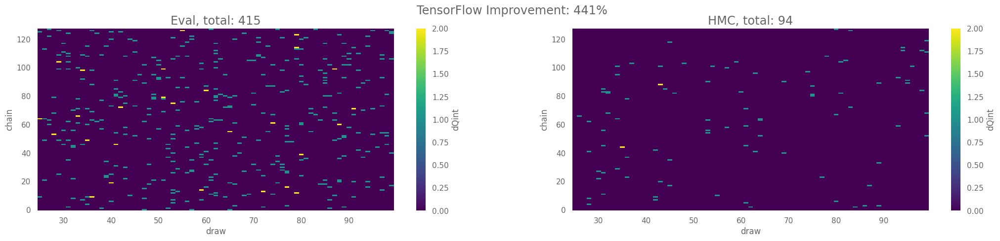

In [128]:
sns.set_context('notebook')
ndraws = len(dsets['tf']['eval']['dQint'].draw)
drop = int(0.1 * ndraws)
keep = int(0.9 * ndraws)

dqe = dsets['tf']['eval']['dQint'][:, 25:]
dqh = dsets['tf']['hmc']['dQint'][:, 25:]

etot = dqe.astype(int).sum()
htot = dqh.astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dqe.astype(int).plot(ax=ax[0])
_ = dqh.astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot}', fontsize='x-large');
_ = ax[1].set_title(f'HMC, total: {htot}', fontsize='x-large');
_ = fig.suptitle(fr'TensorFlow Improvement: {100*(etot / htot):3.0f}%', fontsize='x-large')

log.info(f"TensorFlow, EVAL\n dQint.sum('chain'):\n {dqe.astype(int).sum('chain').T}")
log.info(f"TensorFlow, HMC\n dQint.sum('chain'):\n {dqh.astype(int).sum('chain').T}")


## PyTorch Results

15:43:54 INFO     PyTorch, EVAL                                                                         ]8;id=791424;file:///tmp/ipykernel_3520770/2384499141.py\2384499141.py]8;;\:]8;id=615731;file:///tmp/ipykernel_3520770/2384499141.py#21\21]8;;\
                   dQint.sum('chain'):                                                                                  
                   [ 6 11 10  3  3  3  7  5  6  6 11  6  3  6  5  3  1 14  8  5  9  4 11  5                             
                    5  9  7  5  9  8  3  7  7  7  8  3  5  4  9  3 11 11  4  6  6  4  6  3                              
                   10  3  5  5  9  5  5  9 11  4  9  7  7  2 11  8 13  9  6  4 12  7  6 12                              
                    8  3  7]                                                                                            

         INFO     PyTorch, HMC                                                                          ]8;id=504476;file:///tmp/ipykernel_3520770/2384499141.py\2384499141.py]8;;\:]8;id=503521;file:///tmp/ipykernel_3520770/2384499141.py#22\22]8;;\
                   dQint.sum('chain'):                                                                                  
                   [1 1 1 1 4 1 2 4 1 0 2 0 0 3 2 0 3 0 1 2 1 4 1 2 1 1 3 0 0 2 2 1 1 1 3 1 1                           
                   1 2 3 1 1 1 0 2 0 1 3 1 1 0 0 2 2 0 0 0 0 1 2 1 1 2 0 1 0 0 0 1 1 1 0 1 0                            
                   2]                                                                                                   

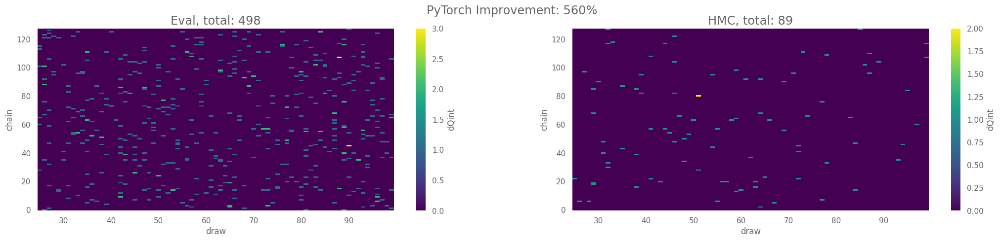

In [129]:
sns.set_context('notebook')
ndraws = len(dsets['pt']['eval']['dQint'].draw)
drop = int(0.1 * ndraws)
keep = int(0.9 * ndraws)

dqe = dsets['pt']['eval']['dQint'][:, 25:]
dqh = dsets['pt']['hmc']['dQint'][:, 25:]

etot = dqe.astype(int).sum()
htot = dqh.astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dqe.astype(int).plot(ax=ax[0])
_ = dqh.astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot}', fontsize='x-large');
_ = ax[1].set_title(f'HMC, total: {htot}', fontsize='x-large');
_ = fig.suptitle(fr'PyTorch Improvement: {100*(etot / htot):3.0f}%', fontsize='x-large')

log.info(f"PyTorch, EVAL\n dQint.sum('chain'):\n {dqe.astype(int).sum('chain').T}")
log.info(f"PyTorch, HMC\n dQint.sum('chain'):\n {dqh.astype(int).sum('chain').T}")


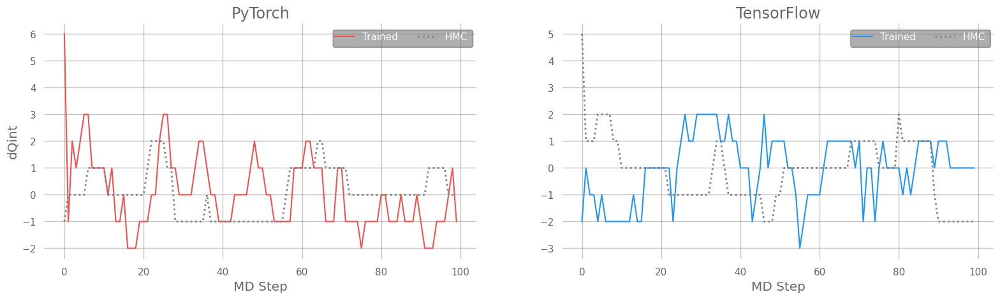

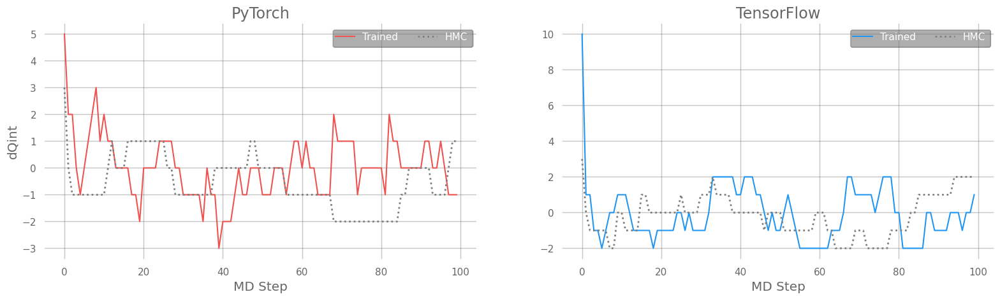

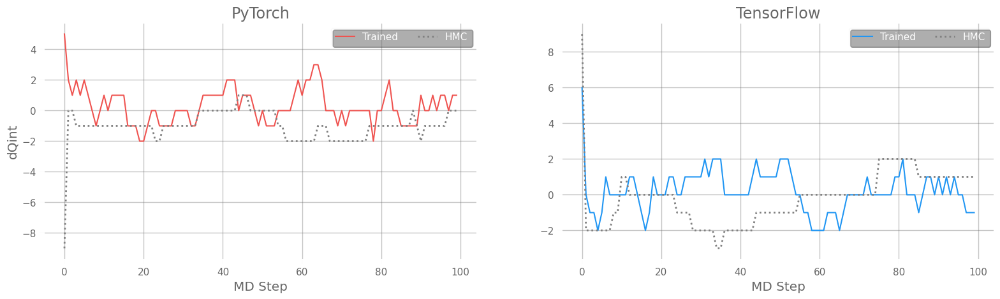

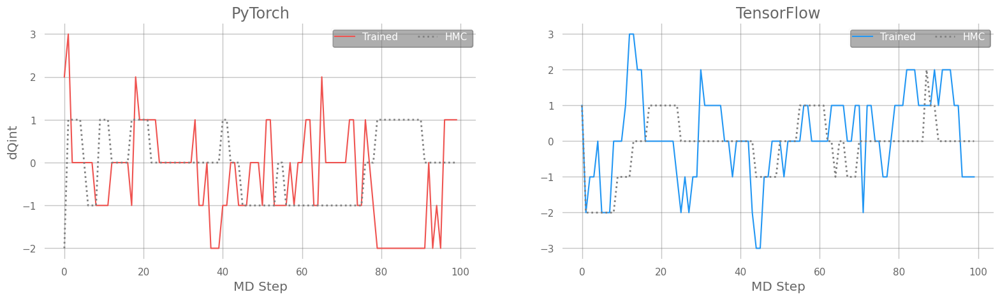

In [130]:
import matplotlib.pyplot as plt
from l2hmc.utils.plot_helpers import set_plot_style, COLORS

import seaborn as sns
set_plot_style()
plt.rcParams['axes.linewidth'] = 2.0
sns.set_context('notebook')
figsize = plt.rcParamsDefault['figure.figsize']
plt.rcParams['figure.dpi'] = plt.rcParamsDefault['figure.dpi']

for idx in range(4):
    fig, (ax, ax1) = plt.subplots(
        ncols=2,
        #nrows=4,
        figsize=(3. * figsize[0], figsize[1]),
    )
    _ = ax.plot(
        dsets['pt']['eval'].intQ[idx],  # .dQint.mean('chain')[100:],
        color=COLORS['red'],
        ls='-',
        label='Trained',
        lw=1.5,
    );

    _ = ax.plot(
        dsets['pt']['hmc'].intQ[idx],  # .dQint.mean('chain')[100:],
        ls=':',
        label='HMC',
        color='#808080',
        zorder=5,
        lw=2.0,
    );

    _ = ax1.plot(
        dsets['tf']['eval'].intQ[idx],  # .dQint.mean('chain')[-100:],
        color=COLORS['blue'],
        ls='-',
        label='Trained',
        lw=1.5,

    );
    _ = ax1.plot(
        dsets['tf']['hmc'].intQ[idx],  # .dQint.mean('chain')[-100:],
        color='#808080',
        ls=':',
        label='HMC',
        zorder=5,
        lw=2.0,
    );
    _ = ax.set_title('PyTorch', fontsize='x-large')
    _ = ax1.set_title('TensorFlow', fontsize='x-large')
    #_ = ax1.set_ylim(ax.get_ylim())
    _ = ax.grid(True, alpha=0.4)
    _ = ax1.grid(True, alpha=0.4)
    _ = ax.set_xlabel('MD Step', fontsize='large')
    _ = ax1.set_xlabel('MD Step', fontsize='large')
    _ = ax.set_ylabel('dQint', fontsize='large')
    _ = ax.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#fff', shadow=True)
    _ = ax1.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#fff', shadow=True)